<a href="https://colab.research.google.com/github/pachterlab/Clytia_single_cell_2020/blob/master/notebooks/CellAtlasAnalysis/starvation_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/pachterlab/Clytia_single_cell_2020/blob/master/notebooks/starvation_Analysis.ipynb)

In [ ]:
!date

Sat Nov 21 21:38:02 UTC 2020


In [ ]:
 #Starvation h5ad data, all nonzero genes included, filtered for 'real cells' from de-multiplexing
!wget --quiet https://caltech.box.com/shared/static/3l60szs0e9hgaax4q9dbuehgoo092xww

In [ ]:
#CellRanger Starvation h5ad data
!wget --quiet https://caltech.box.com/shared/static/ts2i8pid7uky28kke4duyl8jwugx8z4h

In [ ]:
#Kallisto bus clustered starvation data, h5ad

!wget --quiet https://caltech.box.com/shared/static/glwk0aln8a3osfuffab73a47js8n0f4w

In [ ]:
#Human ortholog annotations
!wget --quiet https://caltech.box.com/shared/static/slxs7968tths1xotumohnzwy6pgdtk6k

#Panther annotations
!wget --quiet https://caltech.box.com/shared/static/vx2iztm7tsyvg7rcj93h2w3hhjhn7jnt

#GO Terms
!wget --quiet https://caltech.box.com/shared/static/0ly6k9iwo1nc9dp5zxo8sw7qe0gt4oof

#Saved DeSeq2 Results for Fed/Starved (Differentially expressed under starvation --> perturbed genes)
!wget --quiet https://caltech.box.com/shared/static/vy27o8yx0tb1ub3ifug770y32kr8o833

#Saved gene modules adata
!wget --quiet https://caltech.box.com/shared/static/y31aalvo382do9pyjnbksff606cd1ydh

#Gene Markers to plot (for cell atlas) --> Fig 2 heatmap
!wget --quiet https://caltech.box.com/shared/static/fir0k32obqmj75n2jss6q5ti18zs7dxl

In [ ]:
!pip install --quiet anndata
!pip install --quiet scanpy
!pip3 install --quiet leidenalg
!pip install --quiet louvain

In [ ]:
!pip3 install --quiet rpy2

###**Import Packages** 

In [ ]:
import pandas as pd
import anndata
import scanpy as sc
import numpy as np
import scipy.sparse

import warnings
warnings.filterwarnings('ignore')

from sklearn.neighbors import (KNeighborsClassifier,NeighborhoodComponentsAnalysis)
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

from sklearn.preprocessing import scale

import random

import matplotlib.pyplot as plt
%matplotlib inline
sc.set_figure_params(dpi=125)

import seaborn as sns
sns.set(style="whitegrid")
%load_ext rpy2.ipython

In [ ]:
# See version of all installed packages, last done 11/27/2020
# !pip list -v > pkg_vers_20201127.txt

In [ ]:
#Read in annotations
from io import StringIO

hg_ortho_df = pd.read_csv(StringIO(''.join(l.replace('|', '\t') for l in open('slxs7968tths1xotumohnzwy6pgdtk6k'))),
            sep="\t",header=None,skiprows=[0,1,2,3])

hg_ortho_df[['XLOC','TCONS']] = hg_ortho_df[13].str.split(expand=True) 
hg_ortho_df[['Gene','gi']] = hg_ortho_df[3].str.split(expand=True) 
hg_ortho_df['Description']= hg_ortho_df[11]
#hg_ortho_df.head()

panther_df = pd.read_csv('vx2iztm7tsyvg7rcj93h2w3hhjhn7jnt',
            sep="\t",header=None) #skiprows=[0,1,2,3]

#panther_df.head()

goTerm_df = pd.read_csv('0ly6k9iwo1nc9dp5zxo8sw7qe0gt4oof',
            sep=" ",header=None) #skiprows=[0,1,2,3]


####**How Gene Filtering & Clustering Was Done for Kallisto Processed Data**

In [ ]:
#Read in starvation data

#Kallisto bus h5ad file with no gene filtering 
bus_fs_raw = anndata.read("3l60szs0e9hgaax4q9dbuehgoo092xww")
print(bus_fs_raw )



#CellRanger h5ad file with old louvain clustering
cellRanger_fs = anndata.read("ts2i8pid7uky28kke4duyl8jwugx8z4h")
print(cellRanger_fs)

AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch'
AnnData object with n_obs × n_vars = 13673 × 2657
    obs: 'n_counts', 'n_countslog', 'louvain', 'orgID', 'fed', 'starved', 'fed_ord', 'starved_ord', 'new_fed', 'fed_neighbor_score'
    var: 'n_counts', 'n_cells'
    uns: 'fed_ord_colors', 'louvain', 'louvain_colors', 'louvain_sizes', 'neighbors', 'new_fed_colors', 'orgID_colors', 'paga', 'pca', 'rank_genes_groups', 'starved_ord_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


In [ ]:
bus_fs_raw.obs['orgID'] = pd.Categorical(cellRanger_fs.obs['orgID'])
bus_fs_raw.obs['fed'] = pd.Categorical(cellRanger_fs.obs['fed'])
bus_fs_raw.obs['starved'] = pd.Categorical(cellRanger_fs.obs['starved'])
bus_fs_raw.obs['cellRanger_louvain'] = pd.Categorical(cellRanger_fs.obs['louvain'])
bus_fs_raw

AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch', 'orgID', 'fed', 'starved', 'cellRanger_louvain'

In [ ]:
sc.pp.filter_cells(bus_fs_raw, min_counts=0) #1
sc.pp.filter_genes(bus_fs_raw, min_counts=0)

In [ ]:
bus_fs_raw_sub = bus_fs_raw[bus_fs_raw.obs['fed'] == True]
bus_fs_raw_sub2 = bus_fs_raw[bus_fs_raw.obs['fed'] == False]
bus_fs_raw_sub2


View of AnnData object with n_obs × n_vars = 7062 × 46716
    obs: 'batch', 'orgID', 'fed', 'starved', 'cellRanger_louvain', 'n_counts'
    var: 'n_counts'

In [ ]:
print('Fed reads:' + str(sum(bus_fs_raw_sub.obs['n_counts'])))
print('Starved reads:' + str(sum(bus_fs_raw_sub2.obs['n_counts'])))

Fed reads:37119861.0
Starved reads:30254873.0


In [ ]:
print('Fed cells: '+str(len(bus_fs_raw_sub.obs_names)))
print('Starved cells: '+str(len(bus_fs_raw_sub2.obs_names)))

Fed cells: 6611
Starved cells: 7062


In [ ]:
#Find highly variable genes from all nonzero genes

#How annotated/filtered adata was made

#sc.pp.filter_cells(bus_fs_raw, min_counts=0) #1
#sc.pp.filter_genes(bus_fs_raw, min_counts=0)
bus_fs_raw.obs['n_countslog']=np.log10(bus_fs_raw.obs['n_counts'])

bus_fs_raw.raw = sc.pp.log1p(bus_fs_raw, copy=True)
sc.pp.normalize_per_cell(bus_fs_raw, counts_per_cell_after=1e4)
filter_result = sc.pp.filter_genes_dispersion(
    bus_fs_raw.X, min_mean=0.0125, max_mean=4.5, min_disp=0.2)
sc.pl.filter_genes_dispersion(filter_result)

In [ ]:
#Filter genes from anndata
bus_fs_raw = bus_fs_raw[:, filter_result.gene_subset]

print(bus_fs_raw)

In [ ]:
#Apply cellranger labels

In [ ]:
#How to get PAGA/UMAP embedding

sc.pp.scale(bus_fs_raw, max_value=10)
sc.tl.pca(bus_fs_raw, n_comps=60)
sc.pp.neighbors(bus_fs_raw,n_neighbors=150, n_pcs=60,random_state=42) #use_rep='X_nca'
sc.tl.paga(bus_fs_raw, groups='cellRanger_louvain',)
sc.pl.paga(bus_fs_raw, color=['cellRanger_louvain']))

sc.tl.umap(bus_fs_raw,random_state=42,spread=2.5,min_dist = 0.8,init_pos='paga') #min_dist=0.5,spread=3,   min_dist=0.3


###**Cell Atlas Analysis for previously saved clustered and labeled data**
Use for Cell Atlas markers, labels, perturbation response analysis, etc

In [ ]:
#Read in PREVIOUSLY SAVED clustered + labeled data
bus_fs_clus = anndata.read("glwk0aln8a3osfuffab73a47js8n0f4w")
print(bus_fs_clus )

AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


In [ ]:
#Code here for neighbor score
#Calculate number of neighbors (out of top 15) with same starvation condition
#Input adata object and if score is for fed or starved (True or False)
def neighborScores(adata,conditionBool):
  sc.pp.neighbors(adata,n_neighbors=15)
  neighborDists = adata.uns['neighbors']['distances'].todense()
  counts = []

  for i in range(0,len(adata.obs_names)):
    cellNames = adata.obs_names
      
    #get fed observation for this cell
    cellObs = adata.obs['fed'][cellNames[i]]
      
    #get row for cell
    nonZero = neighborDists[i,:]>0
    l = nonZero.tolist()[0]

    cellRow = neighborDists[i,:]
    cellRow = cellRow[:,l]


    #get 'fed' observations
    obs = adata.obs['fed'][l]
      
    # count # in 'fed' observations == cell obs
    count = 0
    #if cellObs == conditionBool:
    for j in obs:
      if j == conditionBool:
        count += 1
              

    counts += [count]
      
  print(len(counts))

  return counts

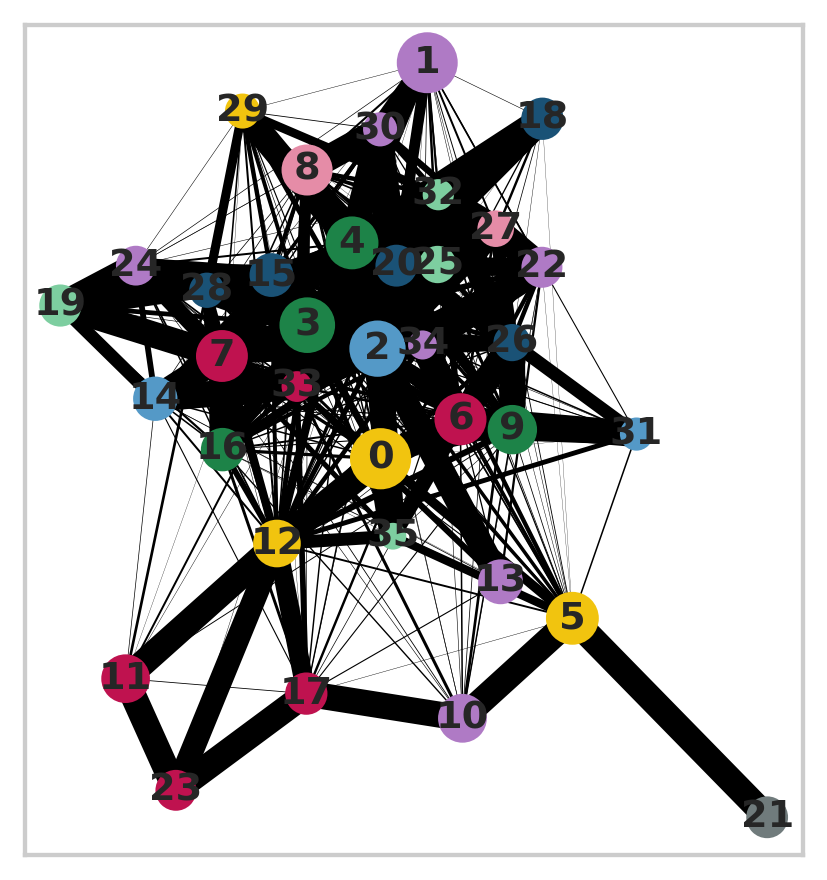

In [ ]:
# sc.pp.neighbors(bus_fs_clus,n_neighbors=150, n_pcs=60,random_state=42) #use_rep='X_nca'
# sc.tl.paga(bus_fs_clus, groups='cellRanger_louvain',)

sc.pl.paga(bus_fs_clus, color=['cellRanger_louvain'])

In [ ]:
bus_fs_clus

AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
# Add fed_neighbor_score to adata

# bus_fs_clus.obs['fed_neighbor_score'] = neighborScores(bus_fs_clus,'True')

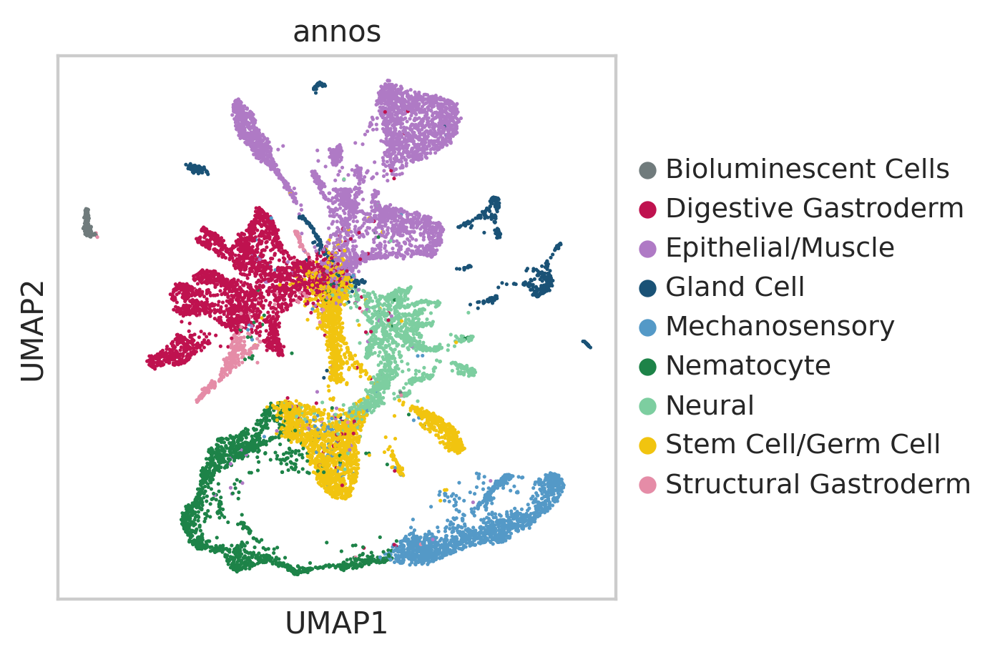

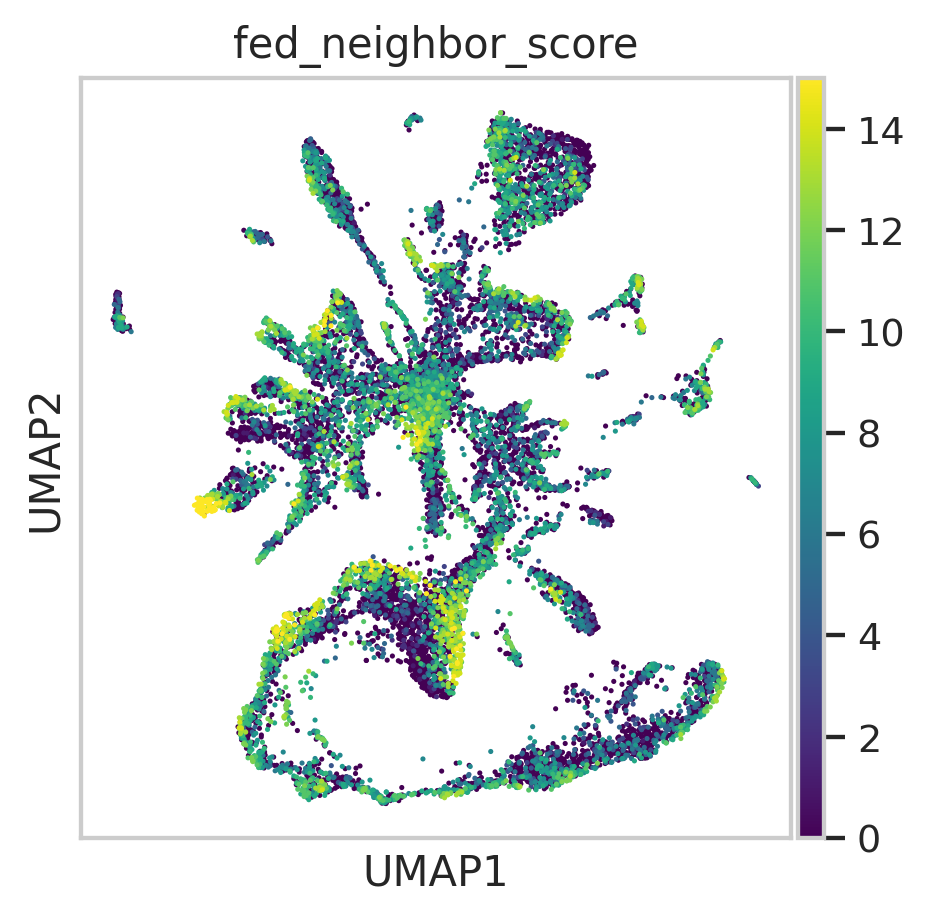

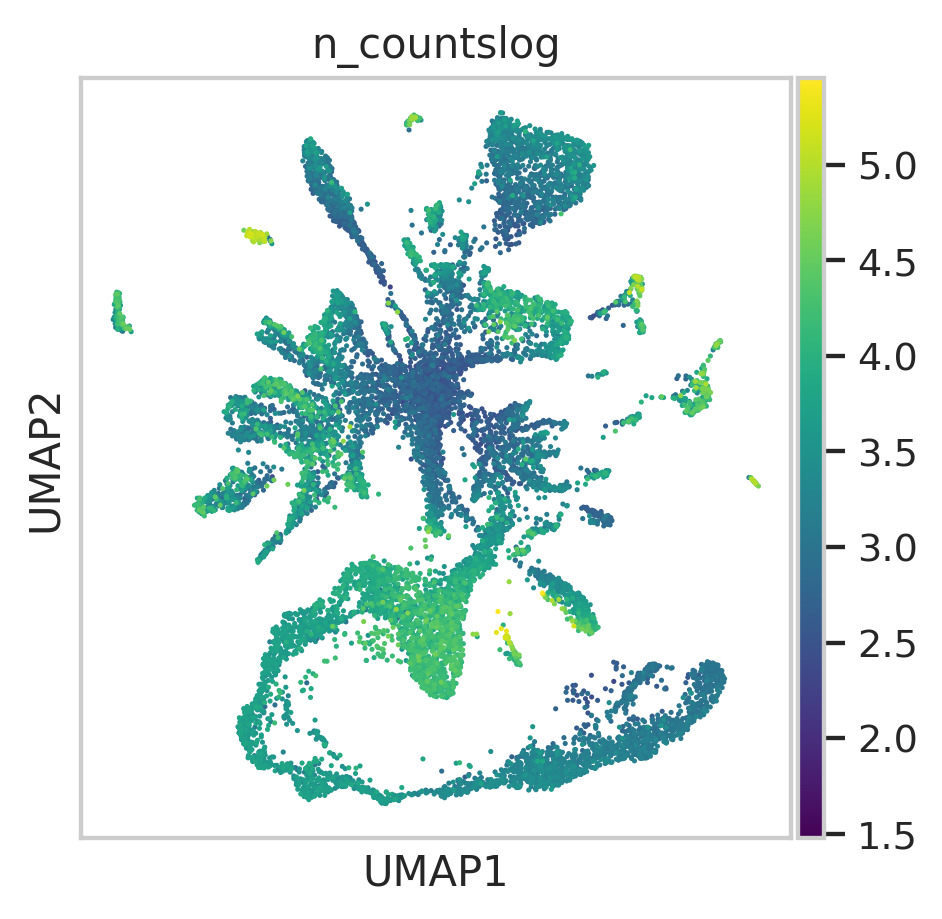

In [ ]:
#sc.tl.umap(bus_fs_clus,random_state=42,spread=2.5,min_dist = 0.8,init_pos='paga') #min_dist=0.5,spread=3,   min_dist=0.3

#bus_fs_clus.obs['fed'] = pd.Categorical(bus_fs_clus.obs['fed'])
sc.pl.umap(bus_fs_clus,color=['annos'])
sc.pl.umap(bus_fs_clus,color=['fed_neighbor_score'],color_map='viridis')
sc.pl.umap(bus_fs_clus,color=['n_countslog'],color_map='viridis')

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


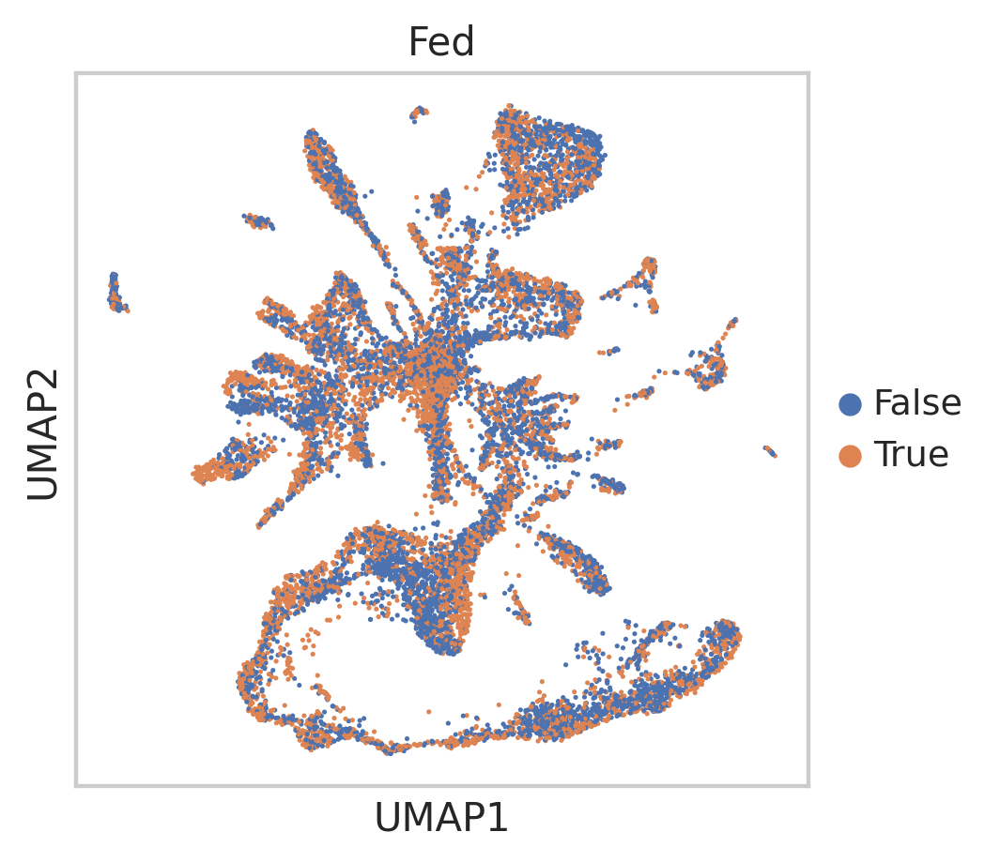

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

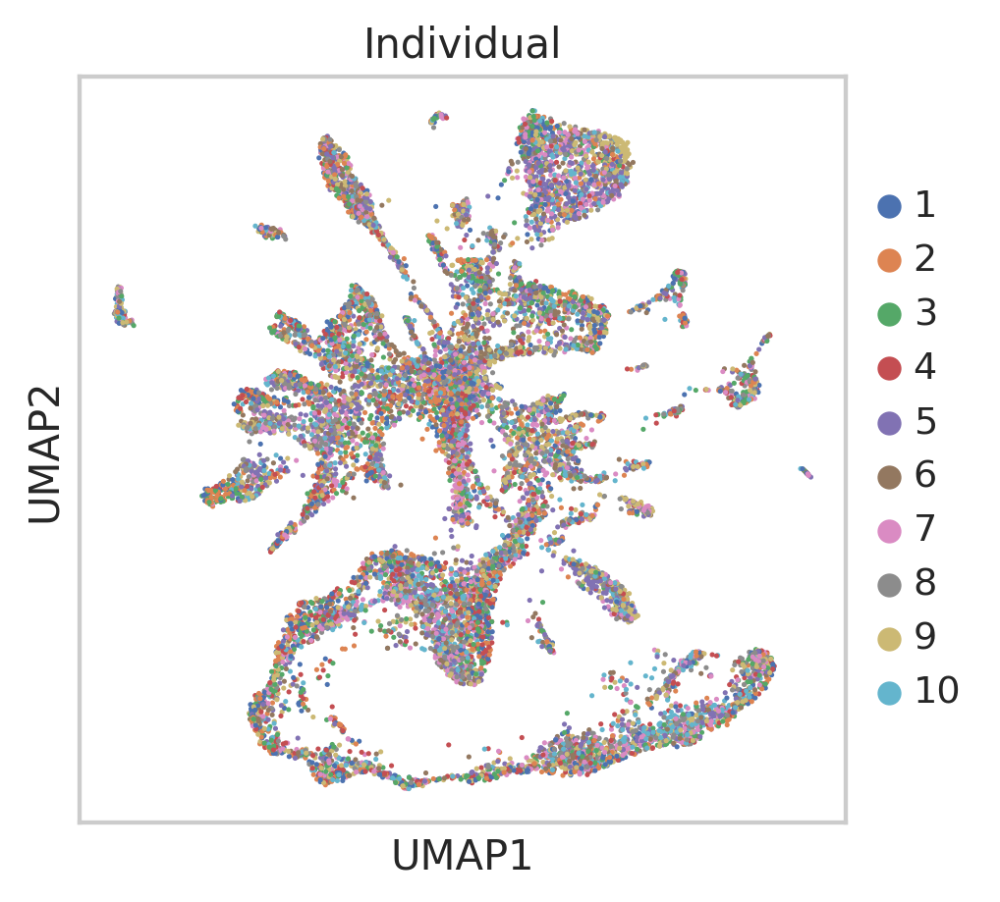

In [ ]:
bus_fs_clus.obs['Fed'] = pd.Categorical(bus_fs_clus.obs['fed'])
sc.pl.umap(bus_fs_clus,color=['Fed'],color_map='viridis')
bus_fs_clus.obs['Individual'] = pd.Categorical(bus_fs_clus.obs['orgID'])
sc.pl.umap(bus_fs_clus,color=['Individual'],color_map='viridis')

####**How Cluster Labels are Assigned**

In [ ]:
def annotateLouvain(bus_fs_clus):
  cluster_types = []
  
  for i in bus_fs_clus.obs_names:

    if bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [35,13,2,0]:
      cluster_types += ['Stem Cell/Germ Cell']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [12,11,23,17]:
      cluster_types += ['Nematocyte']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [5,10,21]:
      cluster_types += ['Mechanosensory']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [6,9,26,31]:
      cluster_types += ['Neural']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [34,22,27,32,25]:
      cluster_types += ['Gland Cell']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [3,7,14,15,19,24]:
      cluster_types += ['Digestive Gastroderm']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [16,33]:
      cluster_types += ['Structural Gastroderm']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [28]:
      cluster_types += ['Bioluminescent Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [1,4,29,18,8,30,20]:
      cluster_types += ['Epithelial/Muscle']
    
    
  bus_fs_clus.obs['annos'] = pd.Categorical(cluster_types)

annotateLouvain(bus_fs_clus)
bus_fs_clus

AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
bus_fs_clus.obs["annos"].cat.categories

Index(['Bioluminescent Cells', 'Digestive Gastroderm', 'Epithelial/Muscle',
       'Gland Cell', 'Mechanosensory', 'Nematocyte', 'Neural',
       'Stem Cell/Germ Cell', 'Structural Gastroderm'],
      dtype='object')

In [ ]:
bus_fs_clus.uns['annos_colors'] = ['#707B7C','#BF124F','#AF7AC5','#1A5276','#5499C7','#1D8348','#7DCEA0','#F1C40F','#E58CA7']


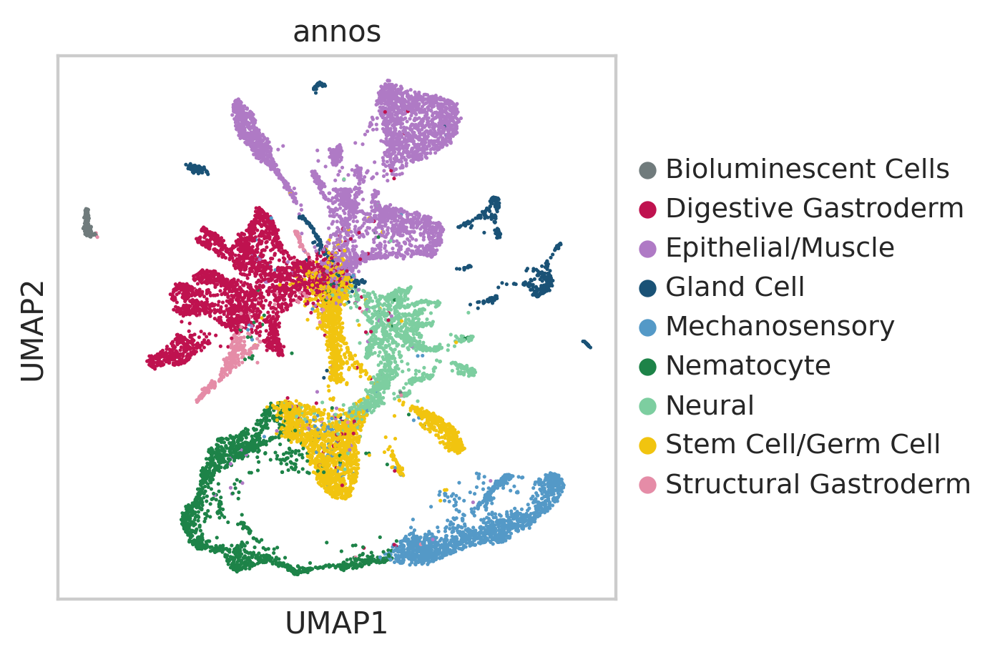

In [ ]:
sc.pl.umap(bus_fs_clus,color="annos")

In [ ]:
#Get colors for broad class annotations, and apply colors to 36 subclusters
colors = bus_fs_clus.uns['annos_colors']
colorsCellR = bus_fs_clus.uns['cellRanger_louvain_colors']

annos_names = bus_fs_clus.obs["annos"].cat.categories
cellR_names = bus_fs_clus.obs["cellRanger_louvain"].cat.categories

annos_dict = {}
annos_dict['Stem Cell/Germ Cell'] = [35,13,2,0]
annos_dict['Nematocyte'] = [12,11,23,17]
annos_dict['Mechanosensory'] = [5,10,21]
annos_dict['Neural'] = [6,9,26,31]
annos_dict['Gland Cell'] = [34,22,27,32,25]
annos_dict['Digestive Gastroderm'] = [3,7,14,15,19,24]
annos_dict['Structural Gastroderm'] = [16,33]
annos_dict['Bioluminescent Cells'] = [28]
annos_dict['Epithelial/Muscle'] = [1,4,29,18,8,30,20]

#annos_dict

In [ ]:
#Update subclusters colors with broad cluster colors
for n in annos_names:
  pos = annos_dict[n]
  for p in pos:
    #new_pos =  np.where(cellR_names == p)
    pos_2 = np.where(annos_names == n)[0][0]
    colorsCellR[p] = colors[pos_2]

#colorsCellR
colorsCopy = colorsCellR.copy()

In [ ]:
#Append color information to adata
bus_fs_clus.obs['new_cellRanger_louvain'] = bus_fs_clus.obs['cellRanger_louvain']
bus_fs_clus.uns['new_cellRanger_louvain_colors'] = colorsCellR

#Convert labels to string format for plotting - and update order of colors
#Make dictionary with cellRanger_louvain 36 clusters and new names --> new_cellRanger_louvain
bus_fs_clus.obs['new_cellRanger_louvain'] = [str(i) for i in bus_fs_clus.obs['new_cellRanger_louvain']]
bus_fs_clus.obs['new_cellRanger_louvain'] = pd.Categorical(bus_fs_clus.obs['new_cellRanger_louvain'])

new_cats = bus_fs_clus.obs['new_cellRanger_louvain'].cat.categories

new_colors = bus_fs_clus.uns['new_cellRanger_louvain_colors']
for i in range(0,len(new_cats)):
  new_colors[i] = colorsCopy[int(new_cats[i])]

bus_fs_clus.uns['new_cellRanger_louvain_colors'] = new_colors

#Create dendrogram for subclusters
sc.tl.dendrogram(bus_fs_clus,'new_cellRanger_louvain',linkage_method='ward')


bus_fs_clus.uns["dendrogram_new_cellRanger_louvain"] = bus_fs_clus.uns["dendrogram_['new_cellRanger_louvain']"]



In [ ]:
bus_fs_clus.uns['new_cellRanger_louvain_colors']

array(['#F1C40F', '#AF7AC5', '#5499C7', '#1D8348', '#1D8348', '#F1C40F',
       '#BF124F', '#BF124F', '#E58CA7', '#1D8348', '#AF7AC5', '#BF124F',
       '#F1C40F', '#AF7AC5', '#5499C7', '#1A5276', '#1D8348', '#BF124F',
       '#1A5276', '#7DCEA0', '#1A5276', '#707B7C', '#AF7AC5', '#BF124F',
       '#AF7AC5', '#7DCEA0', '#1A5276', '#E58CA7', '#1A5276', '#F1C40F',
       '#AF7AC5', '#5499C7', '#7DCEA0', '#BF124F', '#AF7AC5', '#7DCEA0'],
      dtype=object)

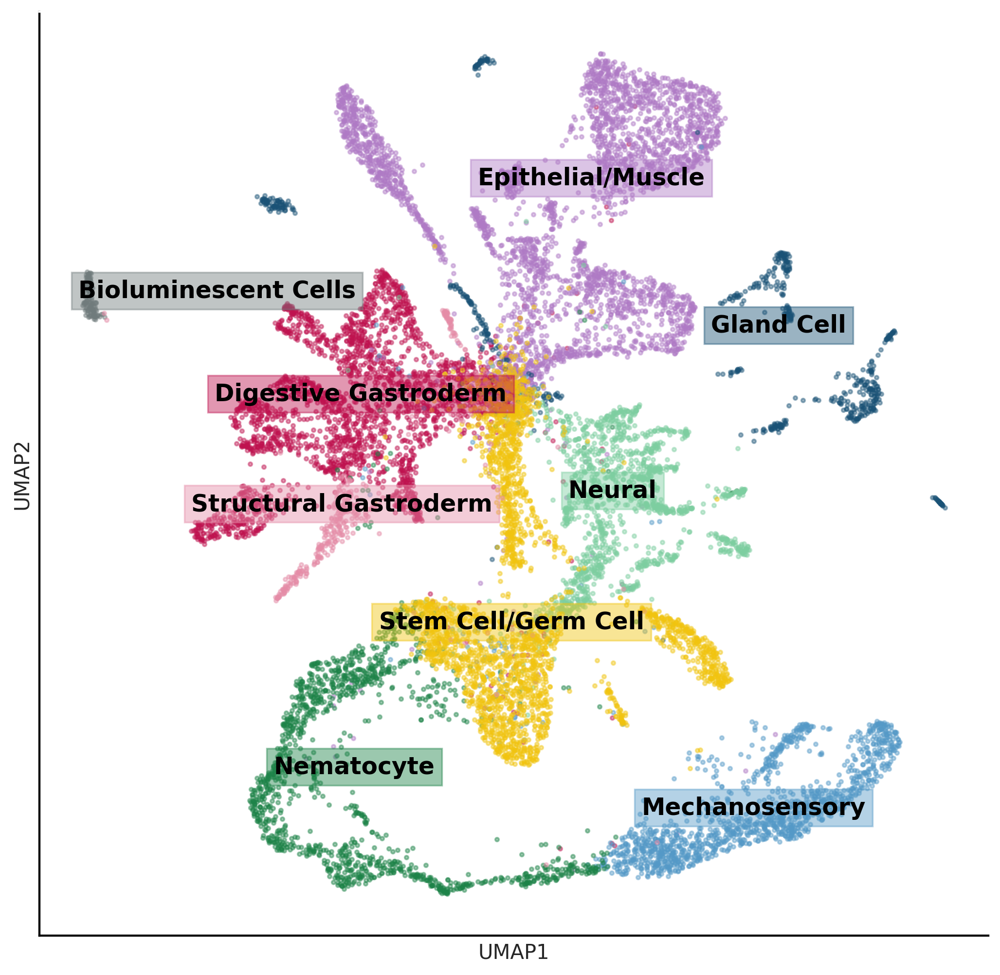

In [ ]:
#Make plot for 9 broad classes of cell types
colors = bus_fs_clus.uns['annos_colors']
colors
fig, ax = plt.subplots(figsize=(10,10))

c = np.unique(bus_fs_clus.obs["annos"].values)
cmap = [i+'70' for i in colors]#plt.cm.get_cmap("tab20")


names = c

for idx, (cluster, name) in enumerate(zip(c, names)):
    XX = bus_fs_clus[bus_fs_clus.obs.annos == cluster,:].obsm["X_umap"]
    
    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, color = cmap[idx], label=cluster,s=5)
    if name == 'Bioluminescent Cells':
      ax.annotate(name, 
                  (np.median(x)+7, np.median(y)),
                  horizontalalignment='center',
                  verticalalignment='bottom',
                  size=14, weight='bold',
                  color="black",
                  backgroundcolor=cmap[idx])
    else:
      ax.annotate(name, 
                  (np.median(x), np.median(y)),
                  horizontalalignment='center',
                  verticalalignment='bottom',
                  size=14, weight='bold',
                  color="black",
                  backgroundcolor=cmap[idx])
 
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.grid(False)
ax.get_xaxis().set_ticks([])
ax.get_yaxis().set_ticks([])
for edge_i in ['bottom','left']:
    ax.spines[edge_i].set_edgecolor("black")
for edge_i in ['top', 'right']:
    ax.spines[edge_i].set_edgecolor("white")

plt.savefig('broadAtlas.pdf') 
plt.show()
 

In [ ]:
#Names for 36 clusters
def annotateLouvainSub(bus_fs_clus):
  cluster_types = []
  
  for i in bus_fs_clus.obs_names:

    if bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [12]:
      cluster_types += ['Nematocyte Precursor']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [17]:
      cluster_types += ['Mature Nematocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [11]:
      cluster_types += ['Late Nematocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [23]:
      cluster_types += ['Early Nematocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [2]:
      cluster_types += ['Large Oocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [13]:
      cluster_types += ['Small Oocytes']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [7]:
      cluster_types += ['Digestive Subtype 2']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [15]:
      cluster_types += ['Digestive Subtype 4']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [3]:
      cluster_types += ['Digestive Subtype 1']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [14]:
      cluster_types += ['Digestive Subtype 3']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [19]:
      cluster_types += ['Digestive Subtype 5']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [24]:
      cluster_types += ['Digestive Subtype 6']


    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [5]:
      cluster_types += ['Mechanosensory Precursor']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [10]:
      cluster_types += ['Mechanosensory Intermediate']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [21]:
      cluster_types += ['Mechanosensory Mature']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [0]:
      cluster_types += ['I-Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [1]:
      cluster_types += ['Exumbrella Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [4]:
      cluster_types += ['Manubrium Epidermis']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [6]:
      cluster_types += ['Neuroblasts']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [9]:
      cluster_types += ['GLWamide & MIH Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [26]:
      cluster_types += ['RFamide Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [31]:
      cluster_types += ['YFamide Cells']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [8]:
      cluster_types += ['Striated Muscle - Subumbrella']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [16]:
      cluster_types += ['Tentacle Bulb Distal Endoderm']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [18]:
      cluster_types += ['Radial Smooth Muscles']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [20]:
      cluster_types += ['Tentacle Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [22]:
      cluster_types += ['Stomach Gland Cells A']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [25]:
      cluster_types += ['Gonad Gland Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [27]:
      cluster_types += ['Stomach Gland Cells B']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [28]:
      cluster_types += ['Tentacle GFP Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [29]:
      cluster_types += ['Gonad Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [30]:
      cluster_types += ['Striated Muscle - Velum']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [32]:
      cluster_types += ['Stomach Gland Cells C']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [33]:
      cluster_types += ['Endodermal Plate']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [34]:
      cluster_types += ['Acidic Chitinase Gland Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [35]:
      cluster_types += ['Early Oocytes']
    
  bus_fs_clus.obs['annosSub'] = pd.Categorical(cluster_types)

annotateLouvainSub(bus_fs_clus)
bus_fs_clus

AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

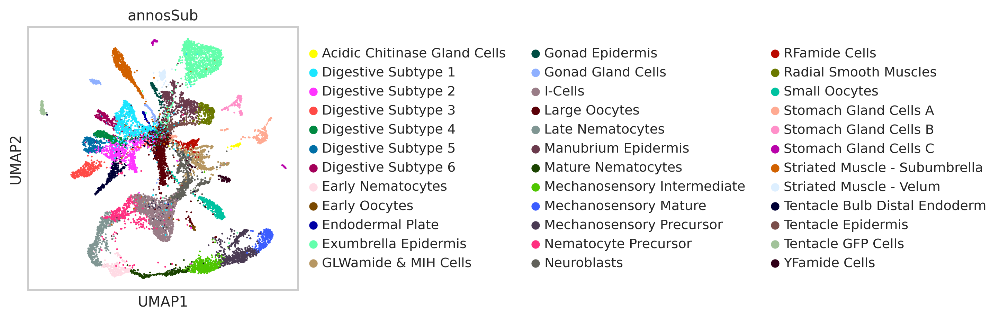

In [ ]:
sc.pl.umap(bus_fs_clus,color='annosSub')

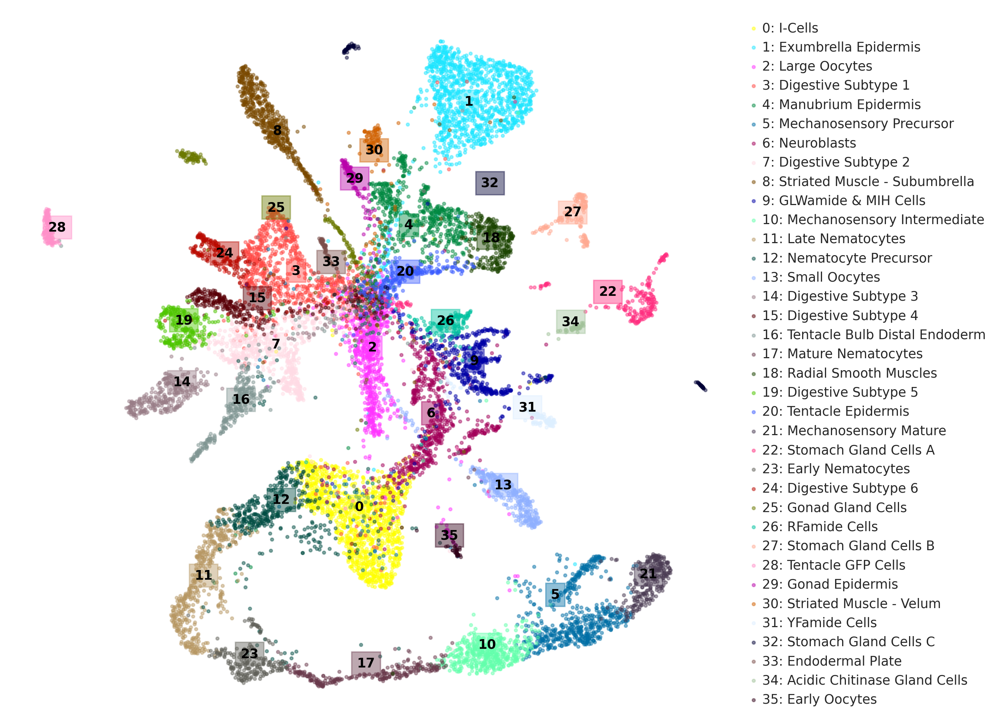

In [ ]:
colors = bus_fs_clus.uns['annosSub_colors']
colors
fig, ax = plt.subplots(figsize=(10,10))

c = np.unique(bus_fs_clus.obs["cellRanger_louvain"].values)
cmap = [i+'70' for i in colors]


names = c

for idx, (cluster, name) in enumerate(zip(c, names)):
    XX = bus_fs_clus[bus_fs_clus.obs.cellRanger_louvain.isin([cluster]),:].obsm["X_umap"]
    text = list(bus_fs_clus[bus_fs_clus.obs.cellRanger_louvain.isin([cluster]),:].obs.annosSub)[0]
    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, color = cmap[idx], label=str(cluster)+': '+text,s=5)
    ax.annotate(name, 
             (np.mean(x), np.mean(y)),
             horizontalalignment='center',
             verticalalignment='bottom',
             size=10, weight='bold',
             color="black",
               backgroundcolor=cmap[idx]) 
    

ax.legend(loc='center left',bbox_to_anchor=(1, 0.5),prop={'size': 10},frameon=False)
ax.set_axis_off()
plt.savefig('36ClusAtlas.pdf')  
plt.show()


In [ ]:
# This is the saved output used in the notebook
# bus_fs_clus.write('fedStarved_withUMAPPaga.h5ad')

####**Heatmaps for Top Markers**

##### **How marker genes selected**

In [ ]:
#Get top n marker genes for each cluster

#Keep top 100 genes, 'louvain_neur' is label for neuron clusters determined using Louvain clustering algorithm
sc.tl.rank_genes_groups(bus_fs_clus, 'cellRanger_louvain',n_genes = 100,method='wilcoxon') #Using non-parametric test for significance

In [ ]:
#Make dataframe, with 100 marker genes for each cluster + annotations
clusters = np.unique(bus_fs_clus.obs['cellRanger_louvain'])
markers = pd.DataFrame()

clus = []
markerGene = []
padj = []
orthoGene = []
orthoDescr = []

pantherNum = []
pantherDescr = []

goTerms = []

for i in clusters:
  genes = bus_fs_clus.uns['rank_genes_groups']['names'][str(i)]

  clus += list(np.repeat(i,len(genes)))
  markerGene += list(genes)
  padj += list(bus_fs_clus.uns['rank_genes_groups']['pvals_adj'][str(i)])

  for g in genes:
        
    sub_df = hg_ortho_df[hg_ortho_df.XLOC.isin([g])]
    panth_df = panther_df[panther_df[0].isin([g])]
    go_df = goTerm_df[goTerm_df[0].isin([g])]

    if len(sub_df) > 0:
      #Save first result for gene/description
      orthoGene += [list(sub_df.Gene)[0]]
      orthoDescr += [list(sub_df.Description)[0]]
    else:
      orthoGene += ['NA']
      orthoDescr += ['NA']


    if len(panth_df) > 0:
      pantherNum += [list(panth_df[1])]
      pantherDescr += [list(panth_df[2])]
    else:
      pantherNum += ['NA']
      pantherDescr += ['NA']


    if len(go_df) > 0:
      goTerms += [list(go_df[1])]
    else:
      goTerms += ['NA']
 

markers['clus'] = clus
markers['markerGene'] = markerGene
markers['padj'] = padj

markers['orthoGene'] = orthoGene
markers['orthoDescr'] = orthoDescr

markers['pantherID'] = pantherNum
markers['pantherDescr'] = pantherDescr

markers['goTerms'] = goTerms
     
markers.head()
#list(neurons.uns['rank_genes_groups']['names']['1'])




,clus,markerGene,padj,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,0,XLOC_010813,0.0,DDX39B,spliceosome RNA helicase DDX39B [Homo sapiens],[PTHR24031:SF521],[SPLICEOSOME RNA HELICASE DDX39B],"[GO:0015931,GO:0051169,GO:0006807,GO:0030529,G..."
1,0,XLOC_043536,0.0,CCT7,T-complex protein 1 subunit eta isoform a [Ho...,[PTHR11353:SF139],[T-COMPLEX PROTEIN 1 SUBUNIT ETA],"[GO:0019538,GO:0044238,GO:0006461,GO:0006457,G..."
2,0,XLOC_008430,0.0,PA2G4,proliferation-associated protein 2G4 [Homo sa...,[PTHR10804:SF125],"[PROLIFERATION-ASSOCIATED 2G4 ,B]","[GO:0016787,GO:0044238,GO:0008152,GO:0006508,G..."
3,0,XLOC_017967,0.0,NA,NA,NA,NA,[nan]
4,0,XLOC_000657,0.0,RPS12,40S ribosomal protein S12 [Homo sapiens],[PTHR11843:SF5],[40S RIBOSOMAL PROTEIN S12],"[GO:0005737,GO:0005622,GO:0032991,GO:0005840,G..."


In [ ]:
#Write to csv
markers.to_csv('fs_marker_annotations.csv')

#Read in csv (previously saved version, uploaded to Box)
markers = pd.read_csv('fs_marker_annotations.csv',
            sep=",")
markers.head()

,Unnamed: 0,clus,markerGene,padj,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,0,0,XLOC_010813,0.0,DDX39B,spliceosome RNA helicase DDX39B [Homo sapiens],['PTHR24031:SF521'],['SPLICEOSOME RNA HELICASE DDX39B'],"['GO:0015931,GO:0051169,GO:0006807,GO:0030529,..."
1,1,0,XLOC_043536,0.0,CCT7,T-complex protein 1 subunit eta isoform a [Ho...,['PTHR11353:SF139'],['T-COMPLEX PROTEIN 1 SUBUNIT ETA'],"['GO:0019538,GO:0044238,GO:0006461,GO:0006457,..."
2,2,0,XLOC_008430,0.0,PA2G4,proliferation-associated protein 2G4 [Homo sa...,['PTHR10804:SF125'],"['PROLIFERATION-ASSOCIATED 2G4 ,B']","['GO:0016787,GO:0044238,GO:0008152,GO:0006508,..."
3,3,0,XLOC_017967,0.0,NaN,NaN,NaN,NaN,[nan]
4,4,0,XLOC_000657,0.0,RPS12,40S ribosomal protein S12 [Homo sapiens],['PTHR11843:SF5'],['40S RIBOSOMAL PROTEIN S12'],"['GO:0005737,GO:0005622,GO:0032991,GO:0005840,..."


In [ ]:
topGenes = []
clusts = []
names = []
var_groups = []
var_labels = []

top5 = pd.DataFrame()

ind = 0
n_genes = 5
for j in np.unique(markers.clus):
  sub = markers[markers.clus == j]
  sub.sort_values(by='padj',ascending=True)

  noDups = [i for i in sub.markerGene if i not in topGenes] #Remove duplicate genes
  topGenes += list(noDups[0:n_genes])
  clusts += [j]*n_genes


top5['marker'] = topGenes
top5['clus'] = clusts

top5.to_csv('top5markersAtlas.csv')

  

##### **Read in saved markers for figure**

In [ ]:
#List of top markers for Figure 2, from subset of top5markers
topMarkers = pd.read_csv('fir0k32obqmj75n2jss6q5ti18zs7dxl',sep=",")
topMarkers.head()

,clus,markerGene,annot,orthoGene,orthoDescr,pantherID,pantherDescr,source,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13
0,0.0,XLOC_010813,DDX39B,DDX39B,spliceosome RNA helicase DDX39B [Homo sapiens],['PTHR24031:SF521'],['SPLICEOSOME RNA HELICASE DDX39B'],,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,XLOC_008430,PA2G4,PA2G4,proliferation-associated protein 2G4 [Homo sa...,['PTHR10804:SF125'],"['PROLIFERATION-ASSOCIATED 2G4 ,B']",,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,XLOC_016073,ZP3,NaN,NaN,['PTHR11576'],['ZONA PELLUCIDA SPERM-BINDING PROTEIN 3'],,NaN,NaN,NaN,NaN,NaN,NaN
3,2.0,XLOC_006164,LOT6,NaN,NaN,['PTHR30543:SF12'],['NAD(P)H-DEPENDENT FMN REDUCTASE LOT6'],,NaN,NaN,NaN,NaN,NaN,NaN
4,3.0,XLOC_013735,INXA,NaN,NaN,['PTHR11893:SF41'],['INNEXIN INX7'],,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
topMarkers = topMarkers[0:51]

In [ ]:
topGenes = []
names = []
var_groups = []
var_labels = []
ind = 0

#Add cell type labels for gene markers
for i in np.unique(topMarkers.clus):
  sub = topMarkers[topMarkers.clus == i]


  topGenes += list(sub.markerGene)
  names += list(sub.annot)

  var_groups += [(ind,ind+len(list(sub.annot))-1)]
  var_labels += [str(int(i))] 
  ind += len(list(sub.annot))

In [ ]:
#Add to raw data so all genes can be plotted
#Kallisto bus h5ad file with no gene filtering 
bus_fs_raw = anndata.read("3l60szs0e9hgaax4q9dbuehgoo092xww")
print(bus_fs_raw )

sc.pp.filter_cells(bus_fs_raw, min_counts=0) #1
sc.pp.filter_genes(bus_fs_raw, min_counts=0)

bus_fs_raw.obs['new_cellRanger_louvain'] = bus_fs_clus.obs['new_cellRanger_louvain']
bus_fs_raw.uns["dendrogram_new_cellRanger_louvain"] = bus_fs_clus.uns["dendrogram_new_cellRanger_louvain"]
bus_fs_raw.uns['new_cellRanger_louvain_colors'] = bus_fs_clus.uns['new_cellRanger_louvain_colors']
bus_fs_raw.obs['fed'] = pd.Categorical(bus_fs_clus.obs['fed'])
bus_fs_raw.obs['cellRanger_louvain'] = pd.Categorical(bus_fs_clus.obs['cellRanger_louvain'])



AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch'


In [ ]:
#Plot data with names attached to gene XLOCs
toPlot = bus_fs_raw[:,topGenes]
toPlot.var['names'] = names

sc.pp.log1p(toPlot)

Trying to set attribute `.var` of view, copying.


In [ ]:
#Subsample for clusters > 100 in size
#Subsample from full dataset, across each cluster
def subSample(adata):
  groups = np.unique(adata.obs['cellRanger_louvain'])
  subSample = 100
  cellNames = np.array(adata.obs_names)

  allCells = []
  for i in groups:
      #subSample =  clusSize[i] # REMOVE IF NOT LOOKING AT SIMILARLY SIZED CLUSTERS
      
      cells = np.array(list(adata.obs['cellRanger_louvain'].isin([i])))
      cellLocs = list(np.where(cells)[0])
      
      if len(cellLocs) > 100:
      #Take all cells if < subSample
        choice = random.sample(cellLocs,subSample)
      else:
        choice = cellLocs
     
      pos = list(choice)
      #print(len(pos))
      
      allCells += list(cellNames[pos])

      
  sub = adata[allCells,:]
  return sub


In [ ]:
toPlotSub = subSample(toPlot)
toPlotSub

View of AnnData object with n_obs × n_vars = 3404 × 51
    obs: 'batch', 'n_counts', 'new_cellRanger_louvain', 'fed', 'cellRanger_louvain'
    var: 'n_counts', 'names'
    uns: 'dendrogram_new_cellRanger_louvain', 'new_cellRanger_louvain_colors', 'log1p'

In [ ]:
bus_fs_raw.uns['new_cellRanger_louvain_colors']

array(['#F1C40F', '#AF7AC5', '#5499C7', '#1D8348', '#1D8348', '#F1C40F',
       '#BF124F', '#BF124F', '#E58CA7', '#1D8348', '#AF7AC5', '#BF124F',
       '#F1C40F', '#AF7AC5', '#5499C7', '#1A5276', '#1D8348', '#BF124F',
       '#1A5276', '#7DCEA0', '#1A5276', '#707B7C', '#AF7AC5', '#BF124F',
       '#AF7AC5', '#7DCEA0', '#1A5276', '#E58CA7', '#1A5276', '#F1C40F',
       '#AF7AC5', '#5499C7', '#7DCEA0', '#BF124F', '#AF7AC5', '#7DCEA0'],
      dtype=object)

In [ ]:
sc.set_figure_params(scanpy=True, fontsize=30,dpi=150)
#bus_fs_clus.obs['cellRanger_louvain'] =  pd.Categorical([str(i) for i in bus_fs_clus.obs['cellRanger_louvain']])
sc.pl.heatmap(toPlotSub, names, groupby='new_cellRanger_louvain', dendrogram=True,show_gene_labels=True,
              var_group_positions=var_groups,var_group_labels=var_labels,cmap='PuBuGn',gene_symbols='names',
              standard_scale='var',use_raw=False,swap_axes=True,figsize = (30,30),save='cellAtlas.pdf')

##### Get markers Broad Cluster Markers


In [ ]:
#Get top n marker genes for each cluster

#Keep top  genes with alpha <0.05, 'louvain_neur' is label for neuron clusters determined using Louvain clustering algorithm
sc.tl.rank_genes_groups(bus_fs_clus, 'annos',n_genes = 1000,method='wilcoxon') #Using non-parametric test for significance

In [ ]:
#Make dataframe, with 100 marker genes for each cluster + annotations
clusters = np.unique(bus_fs_clus.obs['annos'])
markers_broad = pd.DataFrame()

clus = []
markerGene = []
padj = []
orthoGene = []
orthoDescr = []

pantherNum = []
pantherDescr = []

goTerms = []

for i in clusters:
  genes = bus_fs_clus.uns['rank_genes_groups']['names'][str(i)]

  clus += list(np.repeat(i,len(genes)))
  markerGene += list(genes)
  padj += list(bus_fs_clus.uns['rank_genes_groups']['pvals_adj'][str(i)])

  for g in genes:
        
    sub_df = hg_ortho_df[hg_ortho_df.XLOC.isin([g])]
    panth_df = panther_df[panther_df[0].isin([g])]
    go_df = goTerm_df[goTerm_df[0].isin([g])]

    if len(sub_df) > 0:
      #Save first result for gene/description
      orthoGene += [list(sub_df.Gene)[0]]
      orthoDescr += [list(sub_df.Description)[0]]
    else:
      orthoGene += ['NA']
      orthoDescr += ['NA']


    if len(panth_df) > 0:
      pantherNum += [list(panth_df[1])]
      pantherDescr += [list(panth_df[2])]
    else:
      pantherNum += ['NA']
      pantherDescr += ['NA']


    if len(go_df) > 0:
      goTerms += [list(go_df[1])]
    else:
      goTerms += ['NA']
 

markers_broad['clus'] = clus
markers_broad['markerGene'] = markerGene
markers_broad['padj'] = padj

markers_broad['orthoGene'] = orthoGene
markers_broad['orthoDescr'] = orthoDescr

markers_broad['pantherID'] = pantherNum
markers_broad['pantherDescr'] = pantherDescr

markers_broad['goTerms'] = goTerms
     
markers_broad.head()
#list(neurons.uns['rank_genes_groups']['names']['1'])




,clus,markerGene,padj,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,Bioluminescent Cells,XLOC_033336,3.152118e-74,CCDC18,PREDICTED: coiled-coil domain-containing prot...,[PTHR18875:SF11],[COILED-COIL DOMAIN-CONTAINING PROTEIN 18],[nan]
1,Bioluminescent Cells,XLOC_033337,3.152118e-74,NA,NA,[PTHR23055],[CALCIUM BINDING PROTEINS],[nan]
2,Bioluminescent Cells,XLOC_006011,3.152118e-74,COG4,conserved oligomeric Golgi complex subunit 4 ...,[PTHR24016:SF14],[CONSERVED OLIGOMERIC GOLGI COMPLEX SUBUNIT 4],"[GO:0006996,GO:0005794,GO:0006810,GO:0032991,G..."
3,Bioluminescent Cells,XLOC_004165,5.425911e-73,NA,NA,NA,NA,[nan]
4,Bioluminescent Cells,XLOC_036531,2.156988e-65,NA,NA,[PTHR37687],[FAMILY NOT NAMED],[nan]


In [ ]:
markers_broad = markers_broad[markers_broad.padj < 0.05]

In [ ]:
topGenes = []
var_groups = []
var_labels = []
ind = 0
n_genes = 5
for i in np.unique(markers_broad.clus):
  sub = markers_broad[markers_broad.clus == i]
  sub.sort_values(by='padj',ascending=True)

  topGenes += list(sub.markerGene[0:n_genes])

  var_groups += [(ind,ind+n_genes-1)]
  var_labels += [str(i)]
  ind += n_genes

In [ ]:
#bus_fs_clus.obs['cellRanger_louvain'] =  pd.Categorical([str(i) for i in bus_fs_clus.obs['cellRanger_louvain']])
sc.pl.heatmap(bus_fs_raw, topGenes, groupby='annos', dendrogram=True,show_gene_labels=True,
              var_group_positions=var_groups,var_group_labels=var_labels,cmap='viridis',standard_scale='var')

In [ ]:
#Write to csv
markers_broad.to_csv('fs_broad_marker_annotations.csv')

##### Low Expression marker genes


In [ ]:
#Set threshold for expression cutoff (just using raw counts)
exprThresh = 10 # num of raw counts
percUniqThresh = 0.9

bus_fs_raw = anndata.read("3l60szs0e9hgaax4q9dbuehgoo092xww")
bus_fs_raw.obs['orgID'] = pd.Categorical(cellRanger_fs.obs['orgID'])
bus_fs_raw.obs['fed'] = pd.Categorical(cellRanger_fs.obs['fed'])
bus_fs_raw.obs['starved'] = pd.Categorical(cellRanger_fs.obs['starved'])
bus_fs_raw.obs['cellRanger_louvain'] = pd.Categorical(cellRanger_fs.obs['louvain'])


sc.pp.filter_genes(bus_fs_raw, min_counts=1) #Filter for at least one count 

exprMat = bus_fs_raw.X.toarray()

candidates = {}
gene_names = bus_fs_raw.var_names
for g in range(0,len(gene_names)):#
  #Where is expression nonzero, etc
  ind = np.where(exprMat[:,g] > exprThresh)
  #Get clusters with above thresh expression
  clusNames = pd.Series(bus_fs_raw.obs['cellRanger_louvain'][ind[0]])

  #Highest percent of unique cluster counts
  normVal = clusNames.value_counts(normalize=True)
  maxPerc = np.max(normVal)
  indMax = np.argmax(normVal)
  if maxPerc >= percUniqThresh:
    candidates[gene_names[g]] = normVal.index[indMax] #Save which cluster had expression
    #save maxPerc
    
print(len(candidates))



1004


In [ ]:
#Make dataframe, with 100 marker genes for each cluster + annotations
lowExpr_markers = pd.DataFrame()

markerGene = []
orthoGene = []
orthoDescr = []

pantherNum = []
pantherDescr = []

goTerms = []
clus = []


for g in candidates.keys():
        
  markerGene += [g]
  clus += [candidates[g]]

  sub_df = hg_ortho_df[hg_ortho_df.XLOC.isin([g])]
  panth_df = panther_df[panther_df[0].isin([g])]
  go_df = goTerm_df[goTerm_df[0].isin([g])]

  if len(sub_df) > 0:
    #Save first result for gene/description
    orthoGene += [list(sub_df.Gene)[0]]
    orthoDescr += [list(sub_df.Description)[0]]
  else:
    orthoGene += ['NA']
    orthoDescr += ['NA']

  if len(panth_df) > 0:
    pantherNum += [list(panth_df[1])]
    pantherDescr += [list(panth_df[2])]
  else:
    pantherNum += ['NA']
    pantherDescr += ['NA']


  if len(go_df) > 0:
    goTerms += [list(go_df[1])]
  else:
    goTerms += ['NA']
  

lowExpr_markers['markerGene'] = markerGene
lowExpr_markers['clus'] = clus

lowExpr_markers['orthoGene'] = orthoGene
lowExpr_markers['orthoDescr'] = orthoDescr

lowExpr_markers['pantherID'] = pantherNum
lowExpr_markers['pantherDescr'] = pantherDescr

lowExpr_markers['goTerms'] = goTerms
      
lowExpr_markers.head()





,markerGene,clus,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,XLOC_000022,2,NA,NA,[PTHR24074],[FAMILY NOT NAMED],[nan]
1,XLOC_000121,32,NA,NA,NA,NA,[nan]
2,XLOC_000038,13,SLC25A34,solute carrier family 25 member 34 [Homo sapi...,[PTHR24089:SF584],[SOLUTE CARRIER FAMILY 25 MEMBER 34],"[GO:0044238,GO:0019538,GO:0009987,GO:0005198,G..."
3,XLOC_000049,2,DRC1,dynein regulatory complex protein 1 [Homo sap...,[PTHR21625:SF3],[DYNEIN REGULATORY COMPLEX PROTEIN 1],[nan]
4,XLOC_000127,13,NA,NA,[PTHR31909:SF5],[PROTEIN 2410004P03RIK],[nan]


In [ ]:
overlap = list(set(markers.markerGene).intersection(lowExpr_markers.markerGene))

In [ ]:
lowExpr_markers = lowExpr_markers[~lowExpr_markers.markerGene.isin(overlap)]
lowExpr_markers.head()

,markerGene,clus,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,XLOC_000022,2,NA,NA,[PTHR24074],[FAMILY NOT NAMED],[nan]
1,XLOC_000121,32,NA,NA,NA,NA,[nan]
2,XLOC_000038,13,SLC25A34,solute carrier family 25 member 34 [Homo sapi...,[PTHR24089:SF584],[SOLUTE CARRIER FAMILY 25 MEMBER 34],"[GO:0044238,GO:0019538,GO:0009987,GO:0005198,G..."
3,XLOC_000049,2,DRC1,dynein regulatory complex protein 1 [Homo sap...,[PTHR21625:SF3],[DYNEIN REGULATORY COMPLEX PROTEIN 1],[nan]
4,XLOC_000127,13,NA,NA,[PTHR31909:SF5],[PROTEIN 2410004P03RIK],[nan]


In [ ]:
len(lowExpr_markers)

765

In [ ]:
lowExpr_markers.to_csv('fs_lowExpr_markers_atlas.csv')

####**DE Gene Analysis Across Clusters (Extract Perturbed Genes)**

In [ ]:
#Remove clusters with < 10 cells per condition

#Read in previously saved data
bus_fs_clus = anndata.read("glwk0aln8a3osfuffab73a47js8n0f4w")
print(bus_fs_clus )

bus_fs_raw = anndata.read("3l60szs0e9hgaax4q9dbuehgoo092xww")

bus_fs_raw = bus_fs_raw[bus_fs_clus.obs_names,]
#bus_fs_raw.obs['orgID'] = bus_fs_clus.obs['orgID']
bus_fs_raw.obs['fed'] = bus_fs_clus.obs['fed']
bus_fs_raw.obs['cellRanger_louvain'] = bus_fs_clus.obs['cellRanger_louvain']
bus_fs_raw


#clusSize

Trying to set attribute `.obs` of view, copying.


AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch', 'fed', 'cellRanger_louvain'

#####**DESeq2 Analysis For Selecting Perturbed Genes**

In [ ]:
#Determine which clusters large enough to do DE with
def clusToKeep(bus_fs_clus):
  keep = []
  clusSize = {}
  for i in np.unique(bus_fs_clus.obs['cellRanger_louvain']):
      cells = bus_fs_clus[bus_fs_clus.obs['cellRanger_louvain'].isin([i])]
      fed_cells = len(cells[cells.obs['fed']=='True'].obs_names)
      starv_cells = len(cells[cells.obs['fed']=='False'].obs_names)
      min_cells = np.min([fed_cells,starv_cells])
      if min_cells > 10:
        keep += [i]
        #clusSize[i] = min_cells
  return keep

In [ ]:
#Subsample from full dataset, across each cluster
def getSampled_Cluster(bus_fs_clus,bus_fs_raw,keep):

  subSample = 100
  cellNames = np.array(bus_fs_clus.obs_names)
  fed = np.array(list(bus_fs_clus.obs['fed'] == 'True'))
  starv = np.array(list(bus_fs_clus.obs['fed'] == 'False'))
  #di = np.array(list(jelly4Raw.obs['condition'] == 'DI'))

  allCells = []
  for i in keep:
      #subSample =  clusSize[i] # REMOVE IF NOT LOOKING AT SIMILARLY SIZED CLUSTERS
      
      cells = np.array(list(bus_fs_clus.obs['cellRanger_louvain'].isin([i])))
      fed_cells = list(np.where(fed & cells)[0])
      starv_cells = list(np.where(starv & cells)[0])
      
      #Take all cells if < subSample
      if len(fed_cells) >= subSample:
          fed_choice = random.sample(fed_cells,subSample)
      else:
          fed_choice = fed_cells
          
      if len(starv_cells) >= subSample:
          starv_choice = random.sample(starv_cells,subSample)
      else:
          starv_choice = starv_cells
          
          
      pos = list(fed_choice)+list(starv_choice)
      #print(len(pos))
      
      allCells += list(cellNames[pos])

      
  sub_raw = bus_fs_raw[allCells,:]
  return sub_raw

In [ ]:
#For full dataset don't filter by highly variable
keep = clusToKeep(bus_fs_clus)
sub_raw = getSampled_Cluster(bus_fs_clus,bus_fs_raw,keep)
print(sub_raw)

sub_raw_copy = sub_raw.copy()
sc.pp.filter_cells(sub_raw, min_counts=0)
sc.pp.filter_genes(sub_raw, min_counts=0)
sc.pp.normalize_per_cell(sub_raw_copy, counts_per_cell_after=1e4)
sub_raw_copy.raw = sc.pp.log1p(sub_raw_copy, copy=True)

#sc.pp.highly_variable_genes(sub_raw_copy,n_top_genes=5000) #This is just a small example, for full data used all nonzero genes
#sub_raw = sub_raw[:,sub_raw_copy.var['highly_variable']]


Trying to set attribute `.obs` of view, copying.


View of AnnData object with n_obs × n_vars = 6026 × 46716
    obs: 'batch', 'fed', 'cellRanger_louvain'


In [ ]:
#Instantiate dataframe with gene names
def makeDF_forR(sub_raw):
  fullDF = pd.DataFrame(scipy.sparse.csr_matrix.toarray(sub_raw.X).T, index = sub_raw.var_names.tolist(), columns= sub_raw.obs_names.tolist())
  conds = sub_raw.obs['fed'].tolist()
  #ids = sub_jelly4Raw.obs['orgID'].tolist()
  clus = sub_raw.obs['cellRanger_louvain'].tolist()

  reps = np.repeat(0,len(sub_raw.obs_names))

  length = len(sub_raw[sub_raw.obs['fed'] == 'True'].obs_names)
  reps[sub_raw.obs['fed'] == 'True'] = range(1,length+1)

  length = len(sub_raw[sub_raw.obs['fed'] == 'False'].obs_names)
  reps[sub_raw.obs['fed'] == 'False'] = range(1,length+1)


  sampleDF = pd.DataFrame({'cell_ID': fullDF.columns}) \
          .assign(condition = conds) \
          .assign(replicate = reps) \
          .assign(cluster = clus) 
  sampleDF.index = sampleDF.cell_ID
  sampleDF.head()

  fullDF.to_csv('fullDF.csv')
  sampleDF.to_csv('sampleDF.csv')

In [ ]:
makeDF_forR(sub_raw)

In [ ]:
%%R 
fullDF <- read.csv(file = 'fullDF.csv')
sampleDF <- read.csv(file = 'sampleDF.csv')
head(sampleDF)

             cell_ID          cell_ID.1 condition replicate cluster
1 GGACAAGAGAGCCTAG-2 GGACAAGAGAGCCTAG-2      True         1       0
2 CGAGAAGCAAGTTGTC-2 CGAGAAGCAAGTTGTC-2      True         2       0
3 GTAGTCAGTCCAAGTT-2 GTAGTCAGTCCAAGTT-2      True         3       0
4 GTGTTAGTCGGTCCGA-2 GTGTTAGTCGGTCCGA-2      True         4       0
5 CCTACACTCAACGGCC-1 CCTACACTCAACGGCC-1      True         5       0
6 TTCGAAGGTATCACCA-2 TTCGAAGGTATCACCA-2      True         6       0


In [ ]:
%%R
rownames(sampleDF) <- sampleDF$cell_ID 
#Replace '.' in cell barcodes with '-'
rownames(fullDF) <- fullDF$X
colnames(fullDF) <- gsub("\\.", "-", colnames(fullDF))
fullDF <- subset(fullDF, select = -c(X) )
head(fullDF)

sampleDF <- subset(sampleDF, select = -c(cell_ID.1) )
# head(sampleDF)
sampleDF$condition <- factor(sampleDF$condition, labels = c("starved", "fed"))

In [ ]:
%%R
install.packages("BiocManager")
BiocManager::install(version = "3.10")


R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

R[write to console]: trying URL 'https://cran.rstudio.com/src/contrib/BiocManager_1.30.10.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 40205 bytes (39 KB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[


Error: Bioconductor version '3.10' requires R version '3.6'; see
  https://bioconductor.org/install


In [ ]:
!sudo apt-get update
!sudo apt-get install libxml2-dev
!sudo apt-get install r-cran-xml
!sudo apt-get install libcurl4-openssl-dev

Get:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Ign:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Ign:3 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release [697 B]
Get:5 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Hit:6 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:7 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release.gpg [836 B]
Get:8 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Hit:10 http://archive.ubuntu.com/ubuntu bionic InRelease
Ign:11 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Packages
Get:11 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Packages [442 kB]
Get:

In [ ]:
%%R 
#install.packages("DESeq2",repos = "http://cran.us.r-project.org")
BiocManager::install("DESeq2")

R[write to console]: Bioconductor version 3.12 (BiocManager 1.30.10), R 4.0.3 (2020-10-10)

R[write to console]: Installing package(s) 'BiocVersion', 'DESeq2'

R[write to console]: also installing the dependencies ‘bit’, ‘bitops’, ‘formatR’, ‘bit64’, ‘plogr’, ‘RCurl’, ‘GenomeInfoDbData’, ‘zlibbioc’, ‘matrixStats’, ‘lambda.r’, ‘futile.options’, ‘RSQLite’, ‘xtable’, ‘GenomeInfoDb’, ‘XVector’, ‘MatrixGenerics’, ‘DelayedArray’, ‘futile.logger’, ‘snow’, ‘AnnotationDbi’, ‘annotate’, ‘S4Vectors’, ‘IRanges’, ‘GenomicRanges’, ‘SummarizedExperiment’, ‘BiocGenerics’, ‘Biobase’, ‘BiocParallel’, ‘genefilter’, ‘locfit’, ‘geneplotter’, ‘RcppArmadillo’


R[write to console]: trying URL 'https://cran.rstudio.com/src/contrib/bit_4.0.4.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 279723 bytes (273 KB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]

In [ ]:
#Make output directory
!mkdir kallistoDEAnalysis_Starv

In [ ]:
%%R
clusters <- unique(sampleDF$cluster)
clusters

 [1]  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
[26] 25 26 27 28 29 30 31 32 33 34 35


In [ ]:
%%R 
install.packages("DESeq2",repos = "http://cran.us.r-project.org")
library("DESeq2")

#library("apeglm")
#library(Rcpp)
#.libPaths()

clusters <- unique(sampleDF$cluster)
Genes <- c()
Cluster <- c()
Condition <- c() 
padj <- c()
log2FC <- c()

for (i in clusters){
 
        indices = which(sampleDF$cluster == i)
        subset = fullDF[,indices]
        subset_meta = subset(sampleDF,cluster == i)


        dds <- DESeqDataSetFromMatrix(countData = subset, colData = subset_meta, design= ~replicate + condition)

        #Set control condition
        dds$condition <- relevel(dds$condition, ref = 'fed')
        dds <- DESeq(dds,test="LRT", reduced=~replicate, sfType="poscounts", useT=TRUE, minmu=1e-6, 
                     minReplicatesForReplace=Inf,betaPrior = FALSE)#parallel = TRUE

        #Starv v Fed results
        res <- results(dds,alpha=0.05,name="condition_starved_vs_fed")
        resLFC <- res 

        resLFC <- na.omit(resLFC)
        resOrdered <- resLFC[resLFC$padj < .05,]
        #Keep log2 fold changes < -1 or > 1
        resOrdered <- resOrdered[abs(resOrdered$log2FoldChange) > 1,] 
        outcomes <- resOrdered[order(resOrdered$padj),]

        Genes <- c(Genes,row.names(outcomes))
        Cluster <- c(Cluster,rep(i,length(row.names(outcomes))))
        Condition <- c(Condition,rep('Starved',length(row.names(outcomes)))) 
        padj <- c(padj,outcomes$padj)
        log2FC <- c(log2FC,outcomes$log2FoldChange)
         
    
}

deGenesDF <- data.frame(matrix(ncol = 6, nrow = length(Genes)))
names(deGenesDF) <- c("Genes", "Cluster", "Condition","padj","padjClus","log2FC")

deGenesDF$Genes <- Genes
deGenesDF$Cluster <- Cluster
deGenesDF$Condition <- Condition
deGenesDF$padj <- padj
deGenesDF$padjClus <- padj*length(unique(Cluster))
deGenesDF$log2FC <- log2FC

write.csv(deGenesDF,'./kallistoDEAnalysis_Starv/deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample.csv')

head(deGenesDF)

R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

R[write to console]: Loading required package: S4Vectors

R[write to console]: Loading required package: stats4

R[write to console]: Loading required package: BiocGenerics

R[write to console]: Loading required package: parallel

R[write to console]: 
Attaching package: ‘BiocGenerics’


R[write to console]: The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


R[write to console]: The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


R[write to console]: The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.

        Genes Cluster Condition         padj     padjClus    log2FC
1 XLOC_028699       0   Starved 5.554489e-16 1.832981e-14 -1.284301
2 XLOC_010635       0   Starved 2.528288e-14 8.343350e-13 -1.492625
3 XLOC_011294       0   Starved 8.348790e-14 2.755101e-12 -1.441413
4 XLOC_034889       0   Starved 1.786565e-13 5.895663e-12 -1.448216
5 XLOC_030861       0   Starved 8.598653e-12 2.837556e-10 -1.570453
6 XLOC_000300       0   Starved 9.348095e-12 3.084871e-10 -1.055198


In [ ]:
%%R -w 20 -h 20 --units in -r 500
#install.packages("UpSetR",repos = "http://cran.us.r-project.org")
#Cite http://people.seas.harvard.edu/~alex/papers/2014_infovis_upset.pdf
library("UpSetR")

deGenesDF <- read.csv(file = './kallistoDEAnalysis_Starv/deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample.csv') #./kallistoDEAnalysis_Starv/deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample.csv

#Bonferronni correction across clusters
deGenesDF_toPlot = subset(deGenesDF,padjClus < .05)

# Create empty list to store vectors
vecsToPlot <- list()

clusters = unique(deGenesDF_toPlot$Cluster)
for (i in 1:length(clusters)){
    subset = subset(deGenesDF_toPlot,Cluster == clusters[i])
    vecsToPlot[[i]] <- unique(subset$Genes)
}

names(vecsToPlot) <- clusters

upset(fromList(vecsToPlot), sets = as.character(clusters),nintersects= NA,order.by = "freq",
      mainbar.y.label='',
      sets.x.label = '',
      text.scale = c(1.5, 2, 1.5, 2, 1.3, 1.3),
      show.numbers = "no",
      point.size = 2.8,
      mb.ratio= c(0.6, 0.4),
      queries = list(list(query = intersects, params = list("0"), color = "firebrick",active = T),
                     list(query = intersects, params = list("6"), color = "firebrick",active = T),
                     list(query = intersects, params = list("3"), color = "firebrick",active = T),
                     list(query = intersects, params = list("9"), color = "firebrick",active = T),
                     list(query = intersects, params = list("14"), color = "firebrick",active = T),
                     list(query = intersects, params = list("15"), color = "firebrick",active = T),
                     list(query = intersects, params = list("19"), color = "firebrick",active = T),
                     list(query = intersects, params = list("8"), color = "firebrick",active = T),
                     list(query = intersects, params = list("28"), color = "firebrick",active = T),
                     list(query = intersects, params = list("21"), color = "firebrick",active = T),
                     list(query = intersects, params = list("16"), color = "firebrick",active = T),
                     list(query = intersects, params = list("18"), color = "firebrick",active = T),
                     list(query = intersects, params = list("22"), color = "firebrick",active = T),
                     list(query = intersects, params = list("24"), color = "firebrick",active = T),
                     list(query = intersects, params = list("27"), color = "firebrick",active = T),
                     list(query = intersects, params = list("29"), color = "firebrick",active = T),
                     list(query = intersects, params = list("30"), color = "firebrick",active = T),
                     list(query = intersects, params = list("32"), color = "firebrick",active = T),
                     list(query = intersects, params = list("33"), color = "firebrick",active = T),
                     list(query = intersects, params = list("34"), color = "firebrick",active = T),
                     list(query = intersects, params = list("35"), color = "firebrick",active = T),
                     list(query = intersects, params = list("10"), color = "firebrick",active = T),
                     list(query = intersects, params = list("11"), color = "firebrick",active = T),
                     list(query = intersects, params = list("12"), color = "firebrick",active = T),
                     list(query = intersects, params = list("17"), color = "firebrick",active = T),
                     list(query = intersects, params = list("23"), color = "firebrick",active = T),
                     list(query = intersects, params = list("26"), color = "firebrick",active = T),
                     list(query = intersects, params = list("31"), color = "firebrick",active = T)))

In [ ]:
deseq_df = pd.read_csv('./kallistoDEAnalysis_Starv/deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample.csv',
            sep=",")
deseq_df.head()

,Unnamed: 0,Genes,Cluster,Condition,padj,padjClus,log2FC
0,1,XLOC_028699,0,Starved,5.554489e-16,1.832981e-14,-1.284301
1,2,XLOC_010635,0,Starved,2.528288e-14,8.343350e-13,-1.492625
2,3,XLOC_011294,0,Starved,8.348790e-14,2.755101e-12,-1.441413
3,4,XLOC_034889,0,Starved,1.786565e-13,5.895663e-12,-1.448216
4,5,XLOC_030861,0,Starved,8.598653e-12,2.837556e-10,-1.570453


In [ ]:
orthoGene = []
orthoDescr = []

pantherNum = []
pantherDescr = []

goTerms = []


for g in deseq_df.Genes:
        
  sub_df = hg_ortho_df[hg_ortho_df.XLOC.isin([g])]
  panth_df = panther_df[panther_df[0].isin([g])]
  go_df = goTerm_df[goTerm_df[0].isin([g])]

  if len(sub_df) > 0:
    #Save first result for gene/description
    orthoGene += [list(sub_df.Gene)[0]]
    orthoDescr += [list(sub_df.Description)[0]]
  else:
    orthoGene += ['NA']
    orthoDescr += ['NA']


  if len(panth_df) > 0:
    #Save first result for gene/description
    pantherNum += [list(panth_df[1])]
    pantherDescr += [list(panth_df[2])]
  else:
    pantherNum += ['NA']
    pantherDescr += ['NA']


  if len(go_df) > 0:
    #Save first result for gene/description
    goTerms += [list(go_df[1])]
  else:
    goTerms += ['NA']
 
deseq_df['orthoGene'] = orthoGene
deseq_df['orthoDescr'] = orthoDescr

deseq_df['pantherID'] = pantherNum
deseq_df['pantherDescr'] = pantherDescr

deseq_df['goTerms'] = goTerms
deseq_df.head()

,Unnamed: 0,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,1,XLOC_028699,0,Starved,5.554489e-16,1.832981e-14,-1.284301,NA,NA,NA,NA,NA
1,2,XLOC_010635,0,Starved,2.528288e-14,8.343350e-13,-1.492625,SRSF1,serine/arginine-rich splicing factor 1 isofor...,[PTHR24012:SF650],[SERINE/ARGININE-RICH SPLICING FACTOR 1],[nan]
2,3,XLOC_011294,0,Starved,8.348790e-14,2.755101e-12,-1.441413,NA,NA,NA,NA,[nan]
3,4,XLOC_034889,0,Starved,1.786565e-13,5.895663e-12,-1.448216,NA,NA,[PTHR13680:SF29],[CDGSH IRON-SULFUR DOMAIN-CONTAINING PROTEIN 2...,[nan]
4,5,XLOC_030861,0,Starved,8.598653e-12,2.837556e-10,-1.570453,SRSF1,serine/arginine-rich splicing factor 1 isofor...,[PTHR24012:SF650],[SERINE/ARGININE-RICH SPLICING FACTOR 1],[nan]


In [ ]:
deseq_df.to_csv('deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample_annotations.csv')

##### **Cluster DE Genes by Expression**

In [ ]:
deGenesDF = pd.read_csv('vy27o8yx0tb1ub3ifug770y32kr8o833') #deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample_annotations.csv
deGenesDF.head()

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms,geneClus
0,0,0,1,XLOC_028699,0,Starved,5.554489e-16,1.832981e-14,-1.284301,NaN,NaN,NaN,NaN,NaN,4
1,1,1,2,XLOC_010635,0,Starved,2.528288e-14,8.343350e-13,-1.492625,SRSF1,serine/arginine-rich splicing factor 1 isofor...,['PTHR24012:SF650'],['SERINE/ARGININE-RICH SPLICING FACTOR 1'],[nan],4
2,2,2,3,XLOC_011294,0,Starved,8.348790e-14,2.755101e-12,-1.441413,NaN,NaN,NaN,NaN,[nan],0
3,3,3,4,XLOC_034889,0,Starved,1.786565e-13,5.895663e-12,-1.448216,NaN,NaN,['PTHR13680:SF29'],['CDGSH IRON-SULFUR DOMAIN-CONTAINING PROTEIN ...,[nan],1
4,4,4,5,XLOC_030861,0,Starved,8.598653e-12,2.837556e-10,-1.570453,SRSF1,serine/arginine-rich splicing factor 1 isofor...,['PTHR24012:SF650'],['SERINE/ARGININE-RICH SPLICING FACTOR 1'],[nan],4


In [ ]:
deGenesDF_sig = deGenesDF[deGenesDF.padjClus < 0.05]

In [ ]:
#Filter raw count dataset
bus_fs_raw = anndata.read("3l60szs0e9hgaax4q9dbuehgoo092xww")
bus_fs_raw = bus_fs_raw [:,np.unique(deGenesDF_sig.Genes)]
bus_fs_raw =bus_fs_raw[bus_fs_clus.obs_names,:]
bus_fs_raw.obs['cellRanger_louvain'] = bus_fs_clus.obs['cellRanger_louvain']
bus_fs_raw.obs['fed'] = bus_fs_clus.obs['fed']

Trying to set attribute `.obs` of view, copying.


In [ ]:
de_gene_adata = anndata.AnnData(X=bus_fs_raw.X.T)
de_gene_adata.var_names = bus_fs_raw.obs_names
de_gene_adata.obs_names = bus_fs_raw.var_names

de_gene_adata_orig = de_gene_adata.copy()
#de_gene_adata

numIntersects = deGenesDF['Genes'].value_counts()
num_intersect = []
for g in de_gene_adata.obs_names: 
    if g in list(deGenesDF['Genes']):
      num_intersect += [numIntersects[g]]
    else:
      num_intersect += [0]
    
de_gene_adata.obs['numIntersects'] = pd.Categorical(num_intersect)

#de_gene_adata

de_gene_adata

AnnData object with n_obs × n_vars = 953 × 13673
    obs: 'numIntersects'

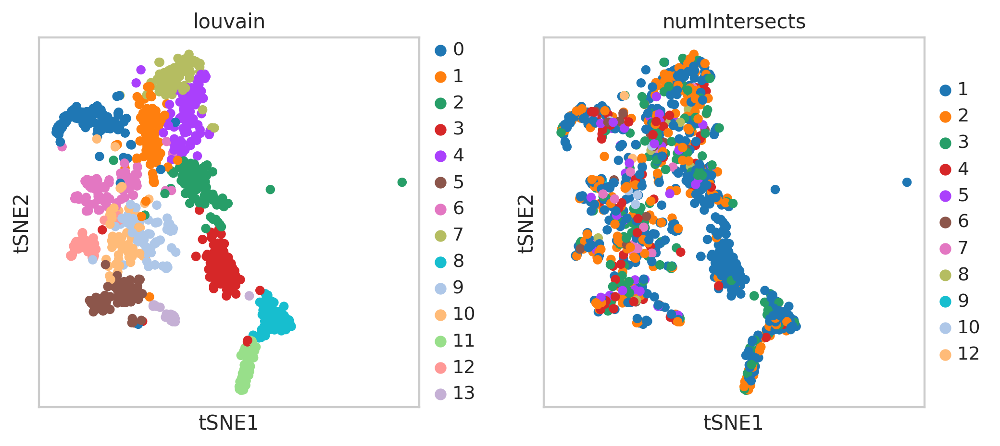

In [ ]:
#Normalize and scale data
sc.pp.filter_genes(de_gene_adata, min_counts=0)

sc.pp.normalize_per_cell(de_gene_adata, counts_per_cell_after=1e4)
de_gene_adata.raw = sc.pp.log1p(de_gene_adata, copy=True)

sc.pp.scale(de_gene_adata, max_value=10)
sc.tl.pca(de_gene_adata, n_comps=60,random_state=42)
#sc.pl.pca_variance_ratio(bus_combo, log=True)

#Determine neighbors for clustering
sc.pp.neighbors(de_gene_adata,n_neighbors=20, n_pcs=15) #n_neighbors=5, n_pcs=15,  20, n_pcs=15
sc.tl.louvain(de_gene_adata,resolution=2)

sc.tl.tsne(de_gene_adata, n_pcs=15,random_state=42)
sc.pl.tsne(de_gene_adata,color=['louvain','numIntersects'])



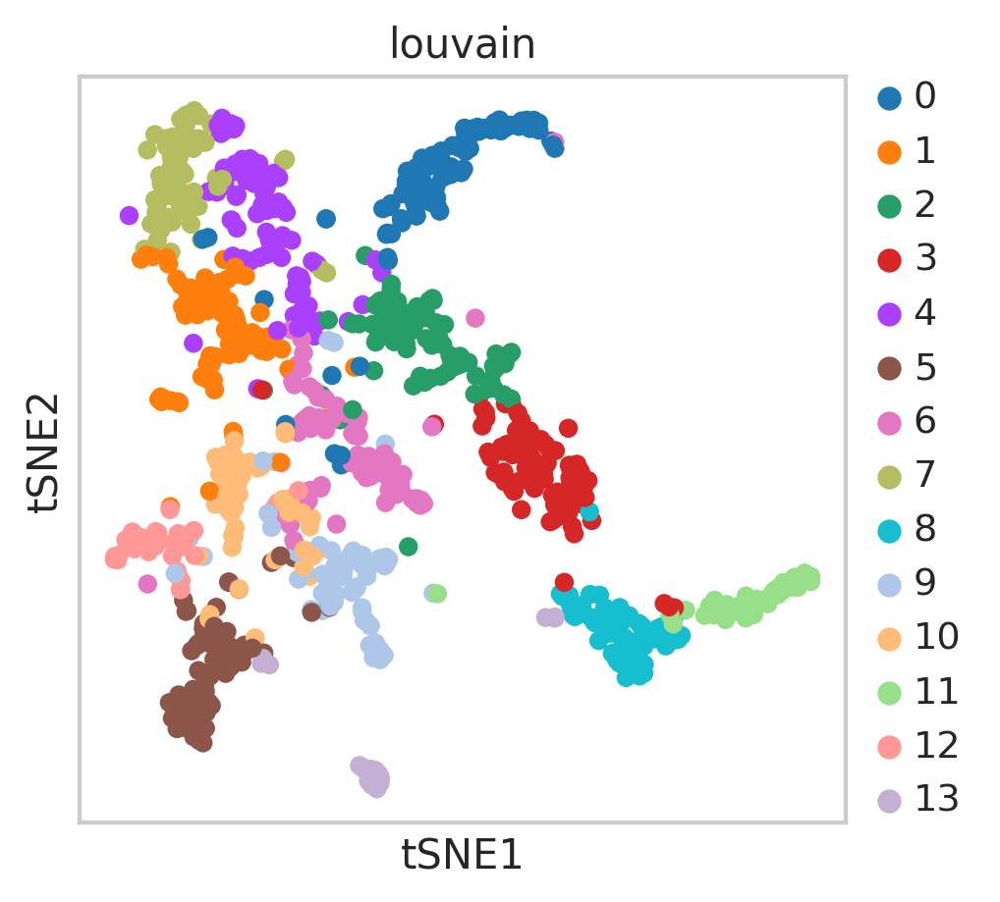

In [ ]:
sc.tl.tsne(de_gene_adata, n_pcs=10,random_state=42,perplexity=15) #
sc.pl.tsne(de_gene_adata,color=['louvain'])

In [ ]:
# Add which gene modules the pertubed genes are in
clusters = []
for g in deGenesDF.Genes:
  if g in list(de_gene_adata.obs_names):
    clus = de_gene_adata[g,:].obs['louvain'][0]
    clusters += [clus]
  else:
    clusters += ['padjClus_not_sig']

deGenesDF['geneClus'] = clusters
deGenesDF.head()

,Unnamed: 0,Unnamed: 0.1,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms,geneClus
0,0,1,XLOC_028699,0,Starved,5.554489e-16,1.832981e-14,-1.284301,NaN,NaN,NaN,NaN,NaN,4
1,1,2,XLOC_010635,0,Starved,2.528288e-14,8.343350e-13,-1.492625,SRSF1,serine/arginine-rich splicing factor 1 isofor...,['PTHR24012:SF650'],['SERINE/ARGININE-RICH SPLICING FACTOR 1'],[nan],4
2,2,3,XLOC_011294,0,Starved,8.348790e-14,2.755101e-12,-1.441413,NaN,NaN,NaN,NaN,[nan],0
3,3,4,XLOC_034889,0,Starved,1.786565e-13,5.895663e-12,-1.448216,NaN,NaN,['PTHR13680:SF29'],['CDGSH IRON-SULFUR DOMAIN-CONTAINING PROTEIN ...,[nan],1
4,4,5,XLOC_030861,0,Starved,8.598653e-12,2.837556e-10,-1.570453,SRSF1,serine/arginine-rich splicing factor 1 isofor...,['PTHR24012:SF650'],['SERINE/ARGININE-RICH SPLICING FACTOR 1'],[nan],4


In [ ]:
deGenesDF.to_csv('atlas_deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample_annotations.csv')

In [ ]:
deGenesDF = pd.read_csv('vy27o8yx0tb1ub3ifug770y32kr8o833') 
deGenesDF.head()

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms,geneClus
0,0,0,1,XLOC_028699,0,Starved,5.554489e-16,1.832981e-14,-1.284301,NaN,NaN,NaN,NaN,NaN,4
1,1,1,2,XLOC_010635,0,Starved,2.528288e-14,8.343350e-13,-1.492625,SRSF1,serine/arginine-rich splicing factor 1 isofor...,['PTHR24012:SF650'],['SERINE/ARGININE-RICH SPLICING FACTOR 1'],[nan],4
2,2,2,3,XLOC_011294,0,Starved,8.348790e-14,2.755101e-12,-1.441413,NaN,NaN,NaN,NaN,[nan],0
3,3,3,4,XLOC_034889,0,Starved,1.786565e-13,5.895663e-12,-1.448216,NaN,NaN,['PTHR13680:SF29'],['CDGSH IRON-SULFUR DOMAIN-CONTAINING PROTEIN ...,[nan],1
4,4,4,5,XLOC_030861,0,Starved,8.598653e-12,2.837556e-10,-1.570453,SRSF1,serine/arginine-rich splicing factor 1 isofor...,['PTHR24012:SF650'],['SERINE/ARGININE-RICH SPLICING FACTOR 1'],[nan],4


In [ ]:
#For topGO analysis (To Assign Labels to Modules)

def returnVal(i):
  if i == i:
    i= i.replace("[","")
    i = i.replace("]","")
    i= i.replace("'","")
    i = i.replace("'","")
    return i 
  else:
    return 'nan'

deGenesDF.goTerms = [returnVal(i) for i in list(deGenesDF.goTerms)]
deGenesDF = deGenesDF[deGenesDF.goTerms != 'nan']
deGenesDF = deGenesDF[deGenesDF.geneClus != 'padjClus_not_sig']

deGenesDF.to_csv('atlas_deseq2_genes_fortopGO_metadata.txt',sep='\t',columns=['Genes','goTerms','geneClus'],
             header=None,index_label=False,index=False)
deGenesDF.to_csv('atlas_deseq2_genes_fortopGO.txt',sep='\t',columns=['Genes','goTerms'],
             header=None,index_label=False,index=False)

##### **DE Genes Across Cell Types**

In [ ]:
deGenesDF = pd.read_csv('vy27o8yx0tb1ub3ifug770y32kr8o833')
deGenesDF.head()

#Read in saved de_gene_adata here
de_gene_adata = anndata.read('y31aalvo382do9pyjnbksff606cd1ydh')
de_gene_adata

AnnData object with n_obs × n_vars = 953 × 13673
    obs: 'numIntersects', 'n_counts', 'louvain', 'clus35', 'clus14', 'clus19'
    var: 'n_counts', 'mean', 'std'
    uns: 'louvain', 'louvain_colors', 'neighbors', 'numIntersects_colors', 'pca'
    obsm: 'X_pca', 'X_tsne'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

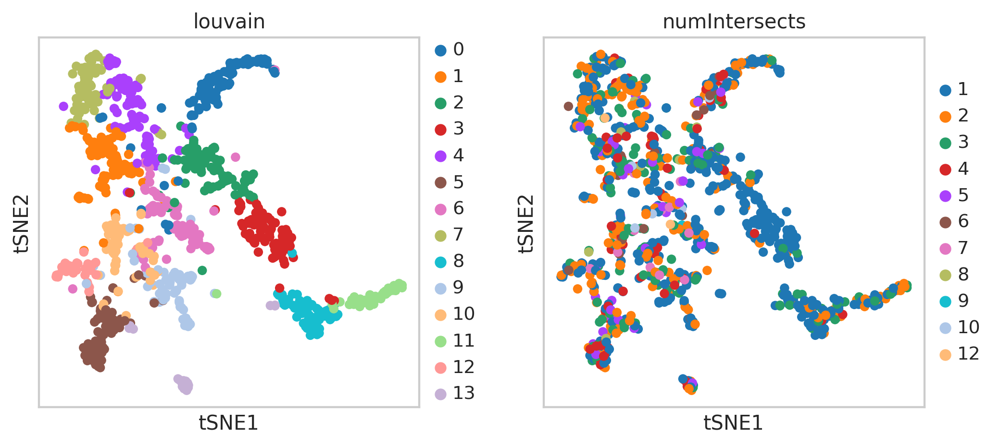

In [ ]:
sc.pl.tsne(de_gene_adata,color=['louvain','numIntersects'])

In [ ]:
#Based on saved topGO output (See script....)
c = np.unique(de_gene_adata.obs["louvain"].values)
print(c)

['0' '1' '10' '11' '12' '13' '2' '3' '4' '5' '6' '7' '8' '9']


In [ ]:
names = ['Protein Synthesis & Stress Response','Oxidative Phosphorylation','Cytoskeletal','Synaptic Transmission & Transport','NA','NA',
         'Phosphate-Containing Metabolic Process','Cell Cycle & Development (Early Oocytes)','Protein Synthesis',
         'Proteolysis & Cell Physiology','Cell Cycle','Protein Synthesis & Transport','Cell-Matrix Adhesion','Metabolic Process']

geneClusNames = dict(zip(c, names)) 

In [ ]:
addNames = []
deGenesDF_sig = deGenesDF[deGenesDF.geneClus != 'padjClus_not_sig']

for i in deGenesDF_sig.geneClus:
  addNames += [geneClusNames[i]]

deGenesDF_sig['names'] = addNames
deGenesDF_sig.head()

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms,geneClus,names
0,0,0,1,XLOC_028699,0,Starved,5.554489e-16,1.832981e-14,-1.284301,NaN,NaN,NaN,NaN,NaN,4,Protein Synthesis
1,1,1,2,XLOC_010635,0,Starved,2.528288e-14,8.343350e-13,-1.492625,SRSF1,serine/arginine-rich splicing factor 1 isofor...,['PTHR24012:SF650'],['SERINE/ARGININE-RICH SPLICING FACTOR 1'],[nan],4,Protein Synthesis
2,2,2,3,XLOC_011294,0,Starved,8.348790e-14,2.755101e-12,-1.441413,NaN,NaN,NaN,NaN,[nan],0,Protein Synthesis & Stress Response
3,3,3,4,XLOC_034889,0,Starved,1.786565e-13,5.895663e-12,-1.448216,NaN,NaN,['PTHR13680:SF29'],['CDGSH IRON-SULFUR DOMAIN-CONTAINING PROTEIN ...,[nan],1,Oxidative Phosphorylation
4,4,4,5,XLOC_030861,0,Starved,8.598653e-12,2.837556e-10,-1.570453,SRSF1,serine/arginine-rich splicing factor 1 isofor...,['PTHR24012:SF650'],['SERINE/ARGININE-RICH SPLICING FACTOR 1'],[nan],4,Protein Synthesis


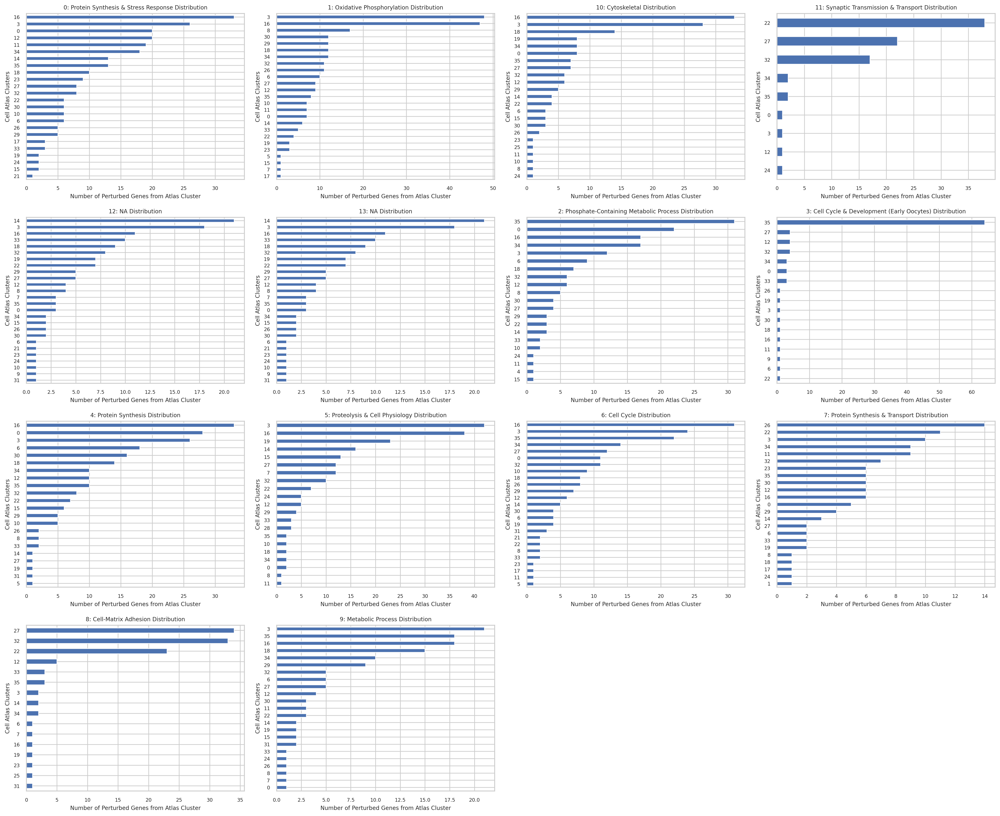

In [ ]:
#https://stackoverflow.com/questions/29530355/plotting-multiple-histograms-in-grid

def draw_plots(df, variables, n_rows, n_cols):
    fig=plt.figure(figsize=(20,20))
    for i, var_name in enumerate(variables):
        ax=fig.add_subplot(n_rows,n_cols,i+1)
        name = geneClusNames[var_name]
        sub = df[df['names'] == name]
        sub.Cluster.value_counts().sort_values().plot(kind = 'barh',ax=ax,fontsize = 7)
        #sub['Cluster'].hist(bins=10,ax=ax)
        ax.set_title(var_name+': '+name+" Distribution",fontsize = 8)
        ax.set_ylabel("Cell Atlas Clusters",fontsize = 8)
        ax.set_xlabel("Number of Perturbed Genes from Atlas Cluster",fontsize = 8)
    fig.tight_layout()  # Improves appearance a bit.

    plt.show()

draw_plots(deGenesDF_sig, np.unique(deGenesDF_sig.geneClus), 5, 4)


###### **Gene Module Plot**

In [ ]:
#Mark DE/Perturbed Genes
def returnDE(i,names):
  if i in list(names):
    return 'DE'
  else:
    return 'nonSig'



In [ ]:
#Mark genes with no GO Terms
def returnVal(i):
  if i == i:
    i= i.replace("[","")
    i = i.replace("]","")
    i= i.replace("'","")
    i = i.replace("'","")
    return i 
  else:
    return 'nan'

def returnGO(i,names):
  if i in names:
    return "withGO"
  else:
    return "n/a"

deGenesDF.goTerms = [returnVal(i) for i in list(deGenesDF.goTerms)]

deGenesDF_sub = deGenesDF[deGenesDF.geneClus != 'padjClus_not_sig']
deGenesDF_sub = deGenesDF_sub[deGenesDF_sub.goTerms != 'nan'] # Has GO Term
withGO_names = list(deGenesDF_sub.Genes)

print(len(np.unique(withGO_names)))

goLabels = [returnGO(i,withGO_names) for i in de_gene_adata.obs_names]
de_gene_adata.obs['withGO'] = pd.Categorical(goLabels)
de_gene_adata

472


AnnData object with n_obs × n_vars = 953 × 13673
    obs: 'numIntersects', 'n_counts', 'louvain', 'clus35', 'clus14', 'clus19', 'withGO'
    var: 'n_counts', 'mean', 'std'
    uns: 'louvain', 'louvain_colors', 'neighbors', 'numIntersects_colors', 'pca'
    obsm: 'X_pca', 'X_tsne'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:

clus14Genes = deGenesDF[deGenesDF.Cluster == 14]
clus19Genes = deGenesDF[deGenesDF.Cluster == 19]
clus35Genes = deGenesDF[deGenesDF.Cluster == 35]

In [ ]:
# Label DE/notDE genes
clus35Labels = [returnDE(i,np.unique(clus35Genes.Genes)) for i in de_gene_adata.obs_names]
de_gene_adata.obs['clus35'] = pd.Categorical(clus35Labels)

clus14Labels = [returnDE(i,np.unique(clus14Genes.Genes)) for i in de_gene_adata.obs_names]
de_gene_adata.obs['clus14'] = pd.Categorical(clus14Labels)

#sc.pl.tsne(de_gene_adata,groups=['DE'],color=['clus14'])

In [ ]:
# Label DE/notDE genes
clus19Labels = [returnDE(i,np.unique(clus19Genes.Genes)) for i in de_gene_adata.obs_names]
de_gene_adata.obs['clus19'] = pd.Categorical(clus19Labels)

#sc.pl.tsne(de_gene_adata,groups=['DE'],color=['clus19'])

In [ ]:
c = list(np.unique(de_gene_adata.obs["louvain"].values))
c

['0', '1', '10', '11', '12', '13', '2', '3', '4', '5', '6', '7', '8', '9']

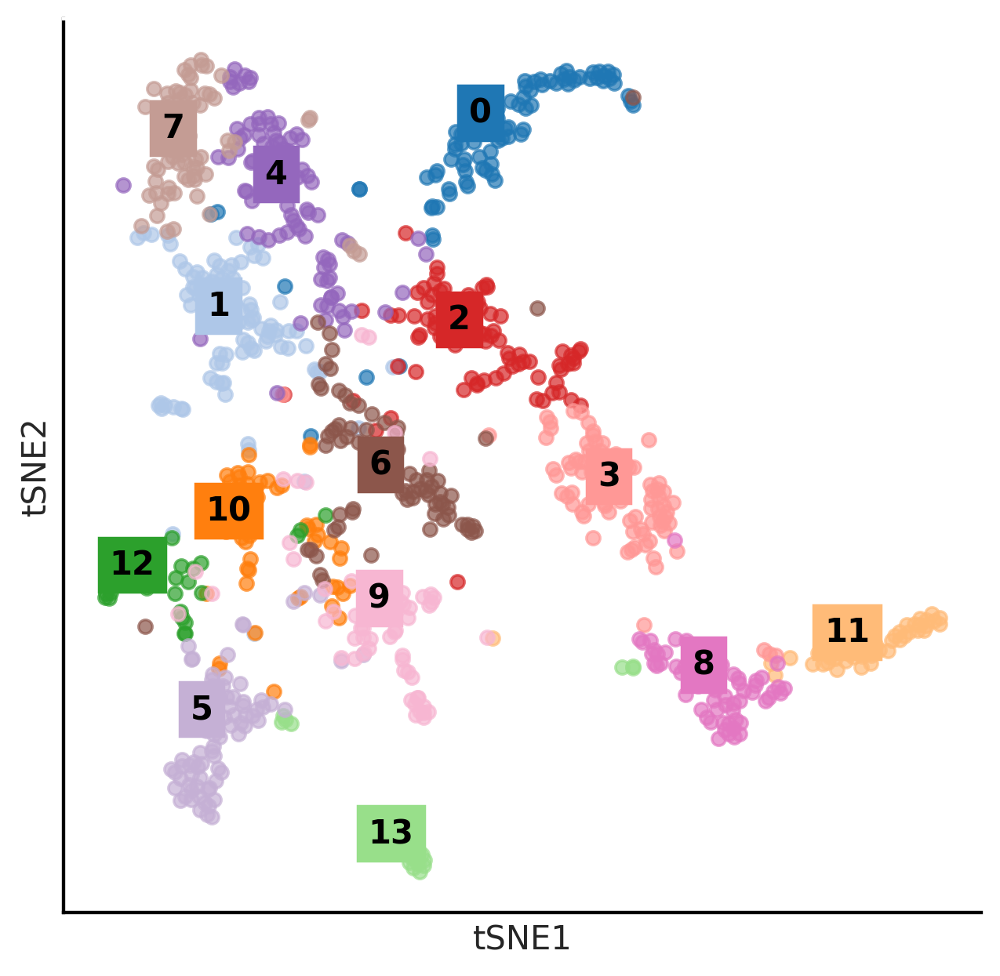

In [ ]:
#Add labels to each cluster in de_gene_adata (from GO terms) on tSNE plot
fig, ax = plt.subplots(figsize=(6,6))

#c = np.unique(de_gene_adata.obs["louvain"].values)
cmap = plt.cm.get_cmap("tab20")


for idx, (cluster, cluster) in enumerate(zip(c, c)):
    XX = de_gene_adata[de_gene_adata.obs.louvain == cluster,:].obsm["X_tsne"]
    
    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, color = cmap(idx), label=cluster,s=25,alpha=0.7)

   
    ax.annotate(cluster, 
                (np.median(x), np.median(y)),
                horizontalalignment='right',
                verticalalignment='bottom',
                size=12, weight='bold',
                color="black",
                backgroundcolor=cmap(idx) )
   
    

#ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
#ax.set_axis_off()
ax.set_xlabel('tSNE1')
ax.set_ylabel('tSNE2')
ax.grid(False)
ax.get_xaxis().set_ticks([])
ax.get_yaxis().set_ticks([])
for edge_i in ['bottom','left']:
    ax.spines[edge_i].set_edgecolor("black")
for edge_i in ['top', 'right']:
    ax.spines[edge_i].set_edgecolor("white")
plt.show()

In [ ]:
# Density plot of perturbed genes with two cell types
def multDensityofDE(de_gene_adata,clusName1,clusName2,label1,label2):
  s = 13
  # Add labels to each cluster in de_gene_adata (from GO terms) on tSNE plot
  fig, ax = plt.subplots(figsize=(3,3))

  XX = de_gene_adata.obsm["X_tsne"]
  
  de1 = np.array([de_gene_adata.obs[clusName1] == 'DE'])
  de2 = np.array([de_gene_adata.obs[clusName2] == 'DE'])

  overlap = list(np.where(de1 & de2)[1])
  only1 = [i for i in list(np.where(de1)[1]) if i not in overlap]
  only2 = [i for i in list(np.where(de2)[1]) if i not in overlap]

  nonsig = [i for i in range(0,len(XX[:,0])) if i not in overlap+only1+only2]
      

  x = XX[nonsig,0]
  y = XX[nonsig,1]
  ax.scatter(x, y, color = 'grey',s=25,alpha=0.1,edgecolors='none') #cmap(idx),label=cluster

  x_DE1 = XX[only1,0]
  y_DE1 = XX[only1,1]
  ax.scatter(x_DE1, y_DE1, color = 'navy',s=25,alpha=0.3,label=label1) #label=cluster

  x_DE2 = XX[only2,0]
  y_DE2 = XX[only2,1]
  ax.scatter(x_DE2, y_DE2, color = 'orange',s=25,alpha=0.3,label=label2) #label=cluster

  x_DE3 = XX[overlap,0]
  y_DE3 = XX[overlap,1]
  ax.scatter(x_DE3, y_DE3, color = 'green',s=25,alpha=0.3,label='Both') #label=cluster

  ax.set_axis_off()
  ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
  plt.show()

# Density plot of perturbed genes with three cell types
def tripleDensityofDE(de_gene_adata,clusName1,clusName2,clusName3,label1,label2):
  s = 13
  # Add labels to each cluster in de_gene_adata (from GO terms) on tSNE plot
  fig, ax = plt.subplots(figsize=(3,3))

  XX = de_gene_adata.obsm["X_tsne"]
  
  de1 = np.array([de_gene_adata.obs[clusName1] == 'DE'])
  de2 = np.array([de_gene_adata.obs[clusName2] == 'DE'])
  de3 = np.array([de_gene_adata.obs[clusName3] == 'DE'])

  overlap = list(np.where((de1 & de2) | (de1 & de3))[1])
  only1 = [i for i in list(np.where(de1)[1]) if i not in overlap]
  other = [i for i in list(np.where(de2 | de3)[1]) if i not in overlap]
 

  nonsig = [i for i in range(0,len(XX[:,0])) if i not in overlap+only1+other]
      

  x = XX[nonsig,0]
  y = XX[nonsig,1]
  ax.scatter(x, y, color = 'grey',s=25,alpha=0.1,edgecolors='none') #cmap(idx),label=cluster

  x_DE1 = XX[only1,0]
  y_DE1 = XX[only1,1]
  ax.scatter(x_DE1, y_DE1, color = 'navy',s=25,alpha=0.3,label=label1) #label=cluster

  x_DE2 = XX[other,0]
  y_DE2 = XX[other,1]
  ax.scatter(x_DE2, y_DE2, color = 'orange',s=25,alpha=0.3,label=label2) #label=cluster

  x_DE3 = XX[overlap,0]
  y_DE3 = XX[overlap,1]
  ax.scatter(x_DE3, y_DE3, color = 'green',s=25,alpha=0.3,label='Shared') #label=cluster

  ax.set_axis_off()
  ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
  plt.show()

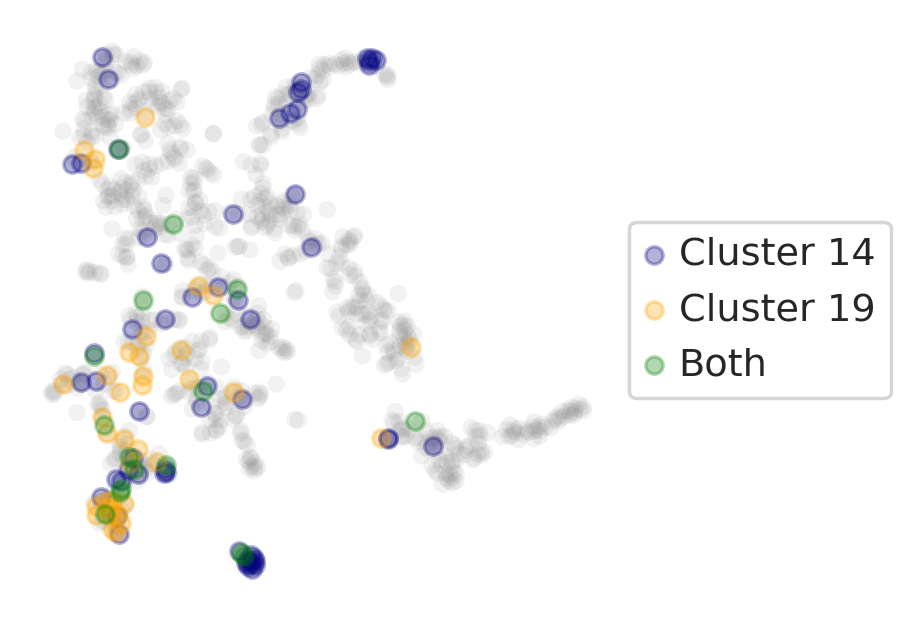

In [ ]:
multDensityofDE(de_gene_adata,'clus14','clus19','Cluster 14','Cluster 19')

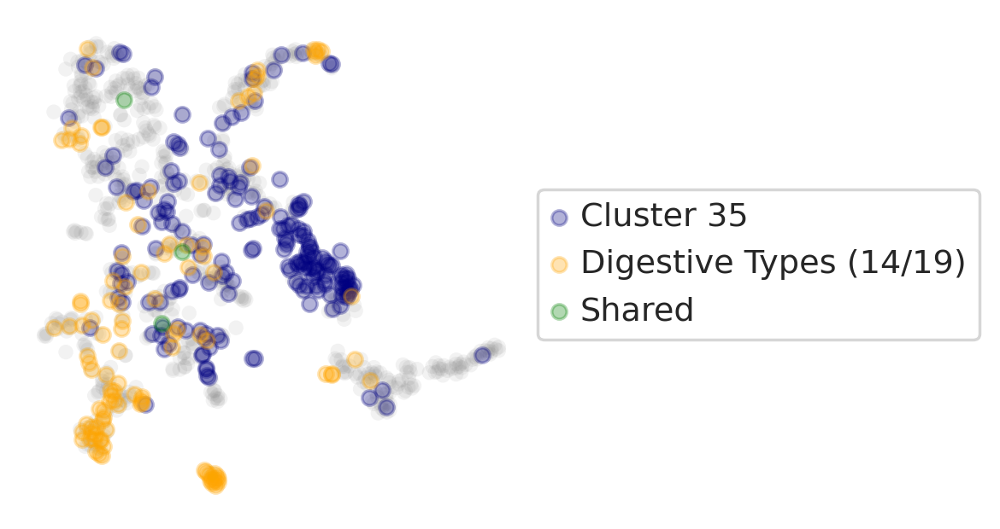

In [ ]:
tripleDensityofDE(de_gene_adata,'clus35','clus14','clus19','Cluster 35','Digestive Types (14/19)')

In [ ]:
#Saved version used for this analysis
#de_gene_adata.write('de_gene_clus_adata.h5ad')

###### **For Gene Cluster SplitsTree Conversion**

In [ ]:
from sklearn.metrics import pairwise_distances

#Centroids of cell atlas/defined clusters
def getClusCentroids(overlap_combo,pcs=60,clusType='knn_clus'):
    clusters = np.unique(overlap_combo.obs[clusType])
    centroids = np.zeros((len(clusters),pcs))
    
    for c in clusters:
        
        sub_data = overlap_combo[overlap_combo.obs[clusType] == c]
        pca_embed = sub_data.obsm['X_pca'][:,0:pcs]
        centroid = pca_embed.mean(axis=0)
        
        centroids[int(c),:] = list(centroid)
        
    return centroids

#Compare to pairwise distances between cell atlas clusters
centroids = getClusCentroids(de_gene_adata,60,'louvain')
#centroids_arr = centroids['centroid'].to_numpy()
pairCentroid_dists = pairwise_distances(centroids, metric = 'l1')
pairCentroid_dists.shape


(14, 14)

In [ ]:
df = pd.DataFrame(pairCentroid_dists)
clus = np.unique(de_gene_adata.obs['louvain'])
df['cluster'] = range(0,len(clus))

clusters = [int(i) for i in de_gene_adata.obs['louvain']]

names = [geneClusDict[str(i)] for i in df['cluster']]

df['annos'] = names

df.to_csv('geneClustDist_SplitsTree.csv')
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,cluster,annos
0,0.000000,115.627783,143.492221,154.445199,139.531540,161.270522,154.411614,154.479290,179.288620,144.515184,118.180061,187.660104,178.807665,202.399721,0,Protein Synthesis & Stress Response
1,115.627783,0.000000,98.075214,143.125559,77.157201,132.257530,104.986413,100.198085,154.236652,120.262093,92.372829,162.726511,162.104749,182.189908,1,Oxidative Phosphorylation
2,143.492221,98.075214,0.000000,134.376313,89.768823,148.965495,132.329147,117.734078,154.317732,126.807212,122.691857,161.371515,178.094517,187.628485,2,Phosphate-Containing Metabolic Process
3,154.445199,143.125559,134.376313,0.000000,131.398811,150.699813,164.020334,161.338567,142.324225,152.467793,129.686223,162.602245,181.032459,206.935751,3,Development & Reproduction
4,139.531540,77.157201,89.768823,131.398811,0.000000,143.979940,120.886121,79.866331,160.604428,123.758153,118.502382,167.547313,167.604706,193.690030,4,Protein Synthesis


##### **Cluster 14 & 19 DE Gene Comparisons/Violin Plots**

In [ ]:
#Kallisto bus h5ad file with no gene filtering 
bus_fs_raw = anndata.read("3l60szs0e9hgaax4q9dbuehgoo092xww")
print(bus_fs_raw )

#Read in PREVIOUSLY SAVED clustered + labeled data (cells x gene)
bus_fs_clus = anndata.read("glwk0aln8a3osfuffab73a47js8n0f4w")
print(bus_fs_clus)
bus_fs_clus.obs['Fed'] = pd.Categorical(bus_fs_clus.obs['fed'])
#sc.pl.umap(bus_fs_clus, color='Fed')


bus_fs_raw.obs['cellRanger_louvain'] = pd.Categorical(bus_fs_clus.obs['cellRanger_louvain'])
bus_fs_raw

AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch'
AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch', 'cellRanger_louvain'

In [ ]:
deGenesDF_sig = deGenesDF[deGenesDF.padjClus < 0.05] 
clusGenes = list(deGenesDF_sig.Genes[deGenesDF_sig.Cluster == 3])
len(clusGenes)

82

In [ ]:
#Expression profiles for perturbed genes in each cell type (all high expression or not)
cellTypes = np.unique(deGenesDF_sig.Cluster)
vals = []
types = []

exprPlots = pd.DataFrame()
for t in cellTypes:
  clusGenes = list(deGenesDF_sig.Genes[deGenesDF_sig.Cluster == t])
  sub = bus_fs_raw[:,clusGenes]
  sub = sub[sub.obs['cellRanger_louvain'].isin([t])]
  toAdd = sub.X.todense().mean(0)
  #Calculate average expression for each gene across cells in type t
  means = toAdd.flatten().tolist()[0]
  vals += means

  types += list(np.repeat(t,len(means)))


exprPlots['cellType'] = types
exprPlots['expr'] = np.log1p(vals)


In [ ]:
exprPlots.head()

,cellType,expr
0,0,2.297710
1,0,1.577077
2,0,2.441016
3,0,1.346493
4,0,1.190470


In [ ]:
#Avg expression for ALL perturbed genes in cell type vs number of perturbed genes from cell type
cellTypes = np.unique(exprPlots.cellType)
avgExpr = []
types = []
dev = []
numGenes = []

avgPlots = pd.DataFrame()
for t in cellTypes:
  sub = exprPlots[exprPlots.cellType == t]

  #Calculate average expression for all genes across cells in type t
  avg = np.mean(sub.expr) 
  avgExpr += [avg]

  types += [t]

  dev += [np.std(sub.expr)]

  numGenes += [len(sub.expr)]

avgPlots['cellType'] = types
avgPlots['expr'] = avgExpr
avgPlots['err'] = dev
avgPlots['numGenes'] = numGenes

avgPlots.head()

,cellType,expr,err,numGenes
0,0,0.917040,0.586861,99
1,3,1.017395,0.673380,82
2,4,0.758826,0.000000,1
3,6,1.286148,0.271556,5
4,7,1.698160,0.690946,6


In [ ]:
colors = bus_fs_clus.uns['annosSub_colors']
c = np.unique(bus_fs_clus.obs["cellRanger_louvain"].values)#np.unique(bus_fs_clus.obs["annosSub"].values)
cmap = [i for i in colors]

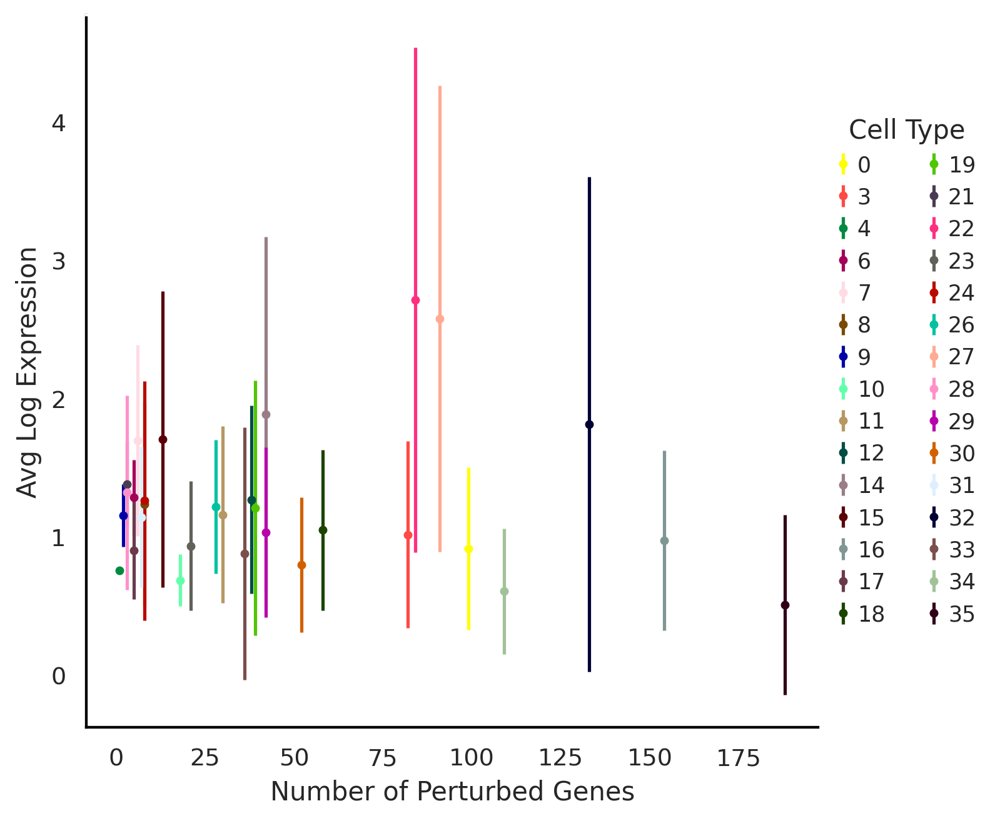

In [ ]:
#Make cdict from 36 cluster labels, bus_fs_clus
fig, ax = plt.subplots(figsize=(6,6))
for g in np.unique(avgPlots.cellType):
    sub = avgPlots[avgPlots.cellType == g]
    ax.errorbar(sub.numGenes, sub.expr, sub.err, c = cmap[g], label = g,linestyle='None', marker='.')

ax.set_xlabel('Number of Perturbed Genes')
ax.set_ylabel('Avg Log Expression')
ax.grid(False)

for edge_i in ['bottom','left']:
    ax.spines[edge_i].set_edgecolor("black")
for edge_i in ['top', 'right']:
    ax.spines[edge_i].set_edgecolor("white")
ax.legend(loc='center left',bbox_to_anchor=(1, 0.5),prop={'size': 10},frameon=False,ncol=2,title="Cell Type")
plt.show()

#plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


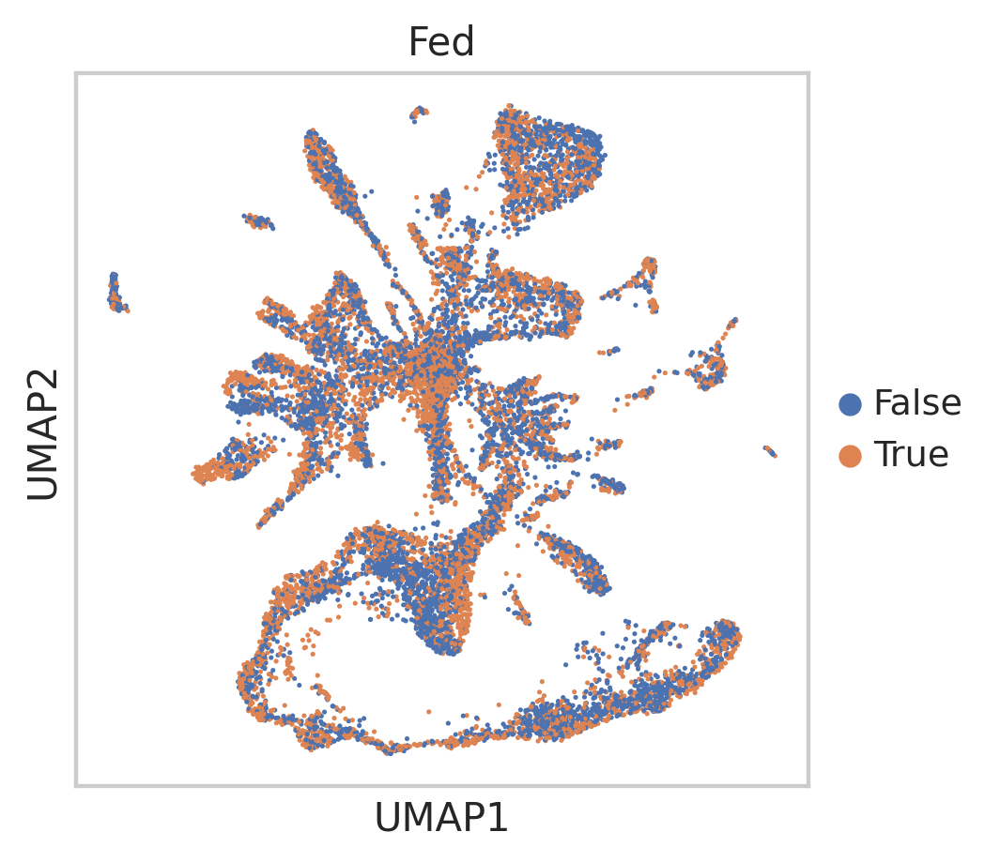

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


In [ ]:
clus14 = bus_fs_clus[bus_fs_clus.obs['cellRanger_louvain'].isin([14])]
clus14.obs['Condition2'] = pd.Categorical(clus14.obs['fed'])
clus19 = bus_fs_clus[bus_fs_clus.obs['cellRanger_louvain'].isin([19])]
clus19.obs['Condition2'] = pd.Categorical(clus19.obs['fed'])

In [ ]:
newOfInterest = ['XLOC_043836','XLOC_043846','XLOC_007437','XLOC_009798','XLOC_008632','XLOC_033541','XLOC_004011'] 

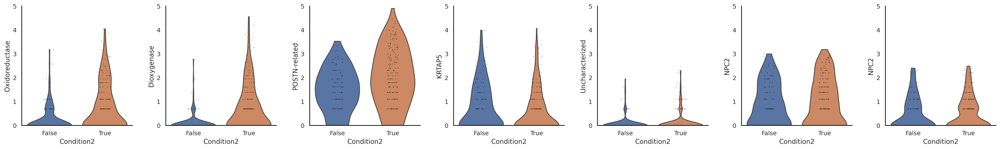

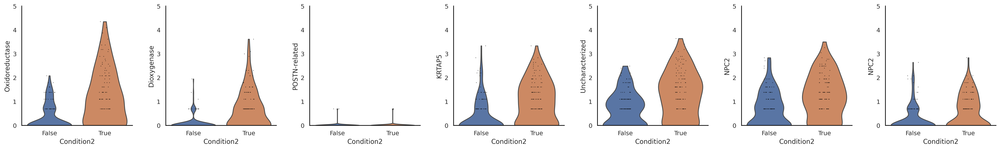

In [ ]:
axes = sc.pl.violin(clus14, newOfInterest, groupby='Condition2',ylabel=['Oxidoreductase','Dioxygenase',
                                                                        'POSTN-related','KRTAP5','Uncharacterized','NPC2','NPC2'],show=False)
for ax in axes:
  ax.set_ylim(0, 5)
  ax.grid(False)
  ax.spines['right'].set_visible(False)
  ax.spines['top'].set_visible(False)
  ax.spines['bottom'].set_color('black')
  ax.spines['left'].set_color('black') 
axes = sc.pl.violin(clus19, newOfInterest, groupby='Condition2',ylabel=['Oxidoreductase','Dioxygenase',
                                                                        'POSTN-related','KRTAP5','Uncharacterized','NPC2','NPC2'],show=False)
for ax in axes:
  ax.set_ylim(0, 5)
  ax.grid(False)
  ax.spines['right'].set_visible(False)
  ax.spines['top'].set_visible(False)
  ax.spines['bottom'].set_color('black')
  ax.spines['left'].set_color('black') 

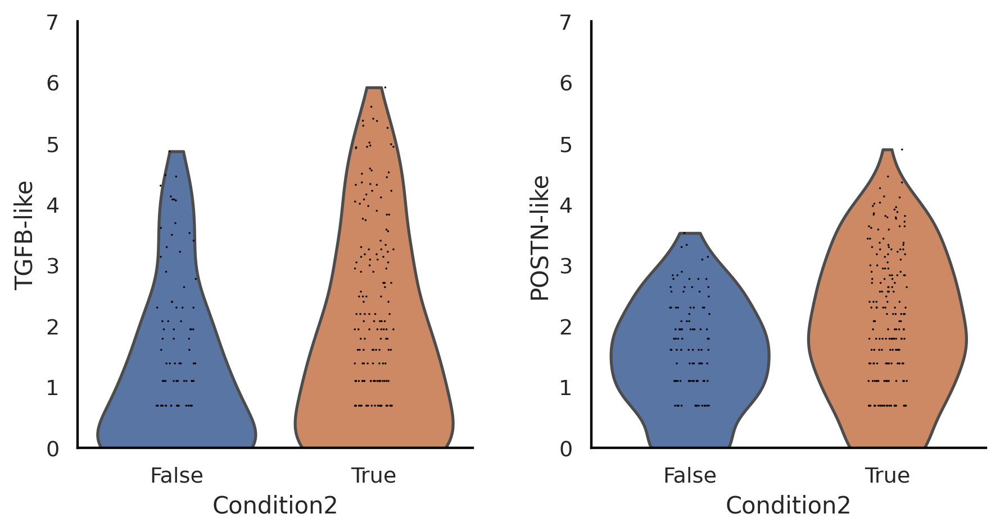

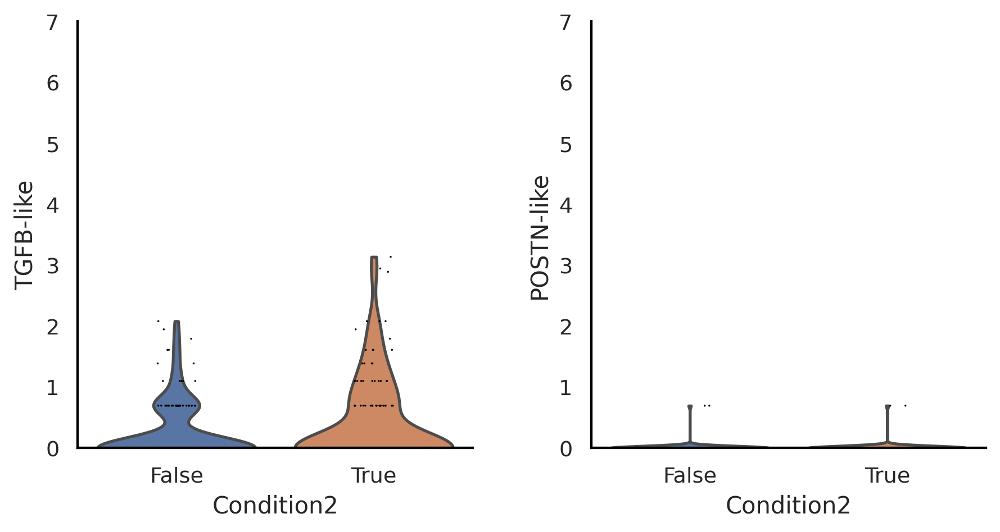

In [ ]:
newOfInterest = ['XLOC_035232','XLOC_007437'] 
axes = sc.pl.violin(clus14, newOfInterest, groupby='Condition2',ylabel=['TGFB-like',
                                                                        'POSTN-like'],show=False)
for ax in axes:
  ax.set_ylim(0, 7)
  ax.grid(False)
  ax.spines['right'].set_visible(False)
  ax.spines['top'].set_visible(False)
  ax.spines['bottom'].set_color('black')
  ax.spines['left'].set_color('black') 

axes = sc.pl.violin(clus19, newOfInterest, groupby='Condition2',ylabel=['TGFB-like',
                                                                        'POSTN-like'],show=False)
for ax in axes:
  ax.set_ylim(0, 7)
  ax.grid(False)
  ax.spines['right'].set_visible(False)
  ax.spines['top'].set_visible(False)
  ax.spines['bottom'].set_color('black')
  ax.spines['left'].set_color('black') 

In [ ]:
clus14Genes = deGenesDF[deGenesDF.Cluster == 14]
clus14Genes = clus14Genes[clus14Genes.geneClus == '5']
clus19Genes = deGenesDF[deGenesDF.Cluster == 19]
clus19Genes = clus19Genes[clus19Genes.geneClus == '5']
clus19Genes.head()
#clus35Genes = deGenesDF[deGenesDF.Cluster == 35]

overlap = list(set(np.unique(clus19Genes.Genes)).intersection(np.unique(clus14Genes.Genes)))
overlap

['XLOC_035232', 'XLOC_017661']

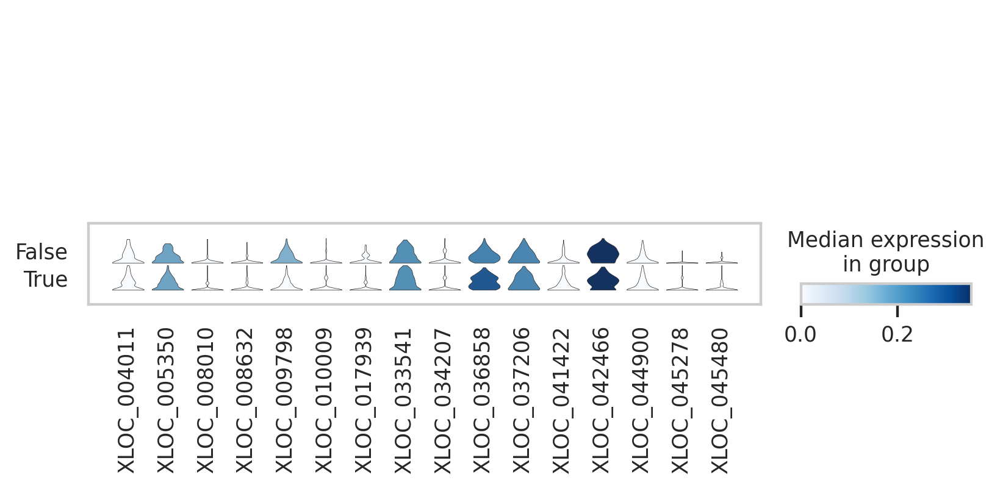

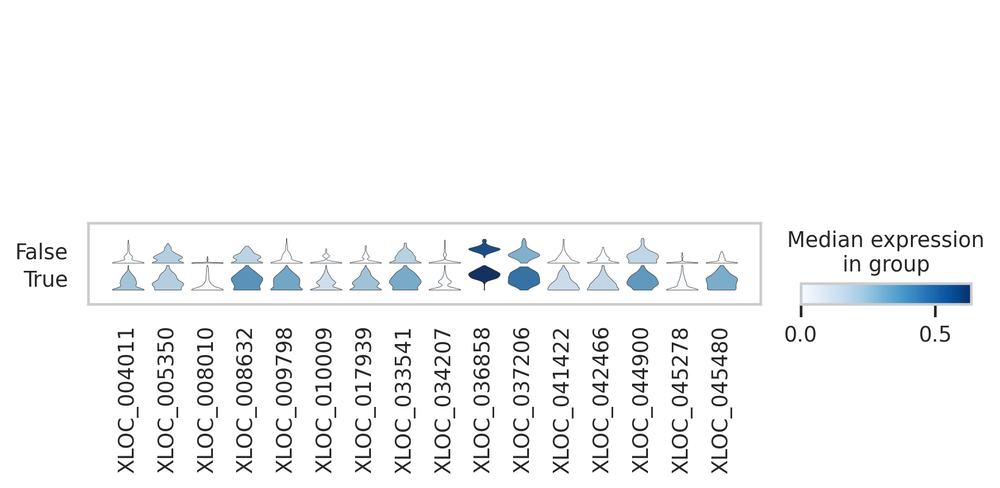

In [ ]:
sub19 = clus19Genes[~clus19Genes.Genes.isin(overlap)]

#sub19.padj = sub19.padj*2
#sub19 = sub19[sub19.padj < 0.05]

sc.pl.stacked_violin(clus14, list(np.unique(sub19.Genes)), groupby='fed',standard_scale='var')
sc.pl.stacked_violin(clus19, list(np.unique(sub19.Genes)), groupby='fed',standard_scale='var')

In [ ]:
#Cluster 35, early oocytes Violin Plots

bus_fs_clus.obs['fed'] = pd.Categorical(bus_fs_clus.obs['fed'])

clus35 = bus_fs_clus[bus_fs_clus.obs['cellRanger_louvain'].isin([35])]


Trying to set attribute `.obs` of view, copying.


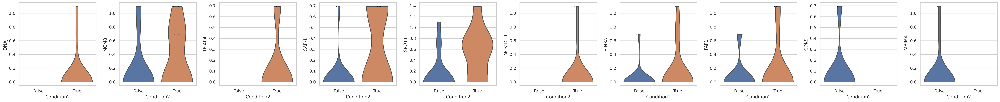

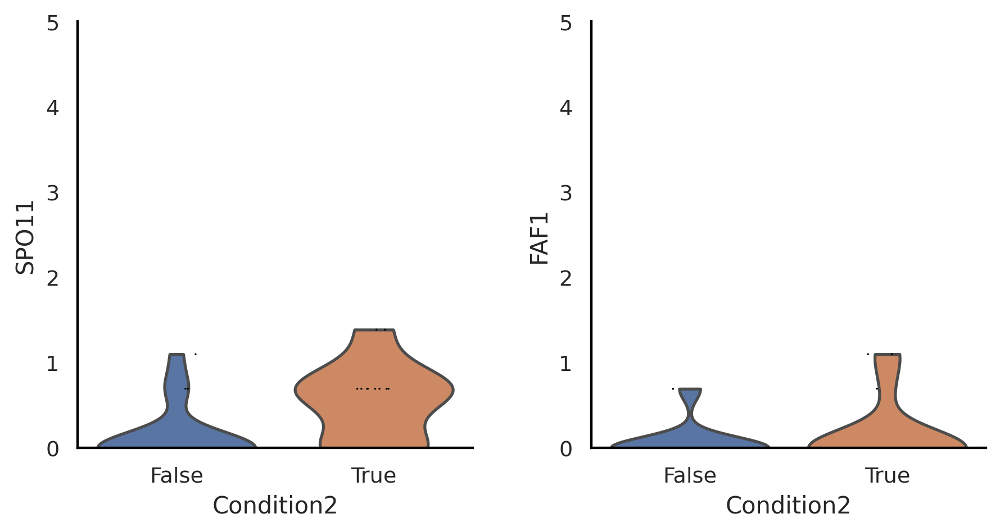

In [ ]:
newOfInterest = ['XLOC_012655','XLOC_004306','XLOC_037567','XLOC_006902','XLOC_016286','XLOC_037771',
                 'XLOC_035249','XLOC_012527','XLOC_001916','XLOC_015039']

clus35.obs['Condition2'] = pd.Categorical(clus35.obs['fed'])
#sc.pl.umap(clus35, color='Condition')
sc.pl.violin(clus35, newOfInterest, groupby='Condition2',ylabel=['DNAJ','MCM8','TF AP4','CAF-1','SPO11','MOV10L1',
                                                                 'SIN3A','FAF1','CDK9','TMBIM4'])



newOfInterest = ['XLOC_016286','XLOC_012527']
#sc.pl.umap(clus35, color='Condition')
axes = sc.pl.violin(clus35, newOfInterest, groupby='Condition2',ylabel=['SPO11','FAF1'],show=False)

for ax in axes:
  ax.set_ylim(0, 5)
  ax.grid(False)
  ax.spines['right'].set_visible(False)
  ax.spines['top'].set_visible(False)
  ax.spines['bottom'].set_color('black')
  ax.spines['left'].set_color('black') 


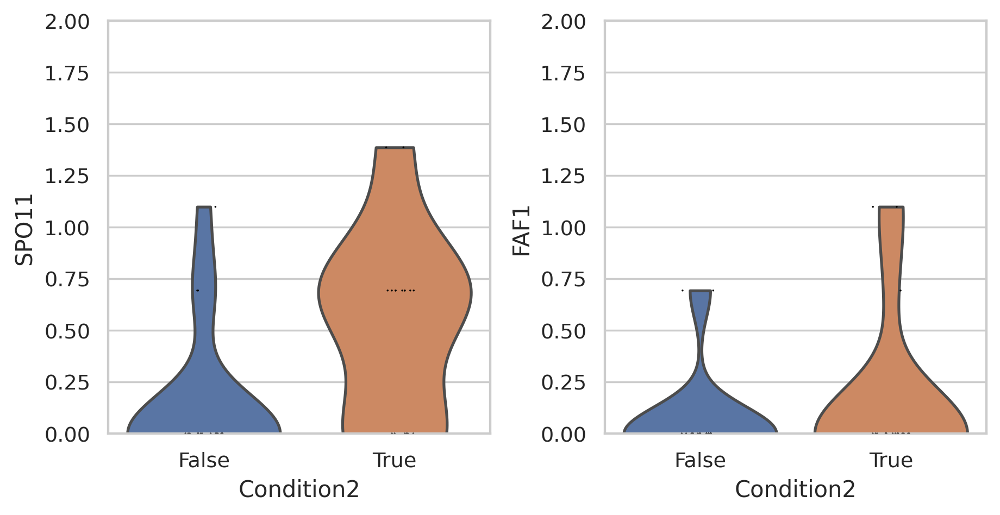

In [ ]:
axes = sc.pl.violin(clus35, newOfInterest, groupby='Condition2',ylabel=['SPO11','FAF1'],show=False)

for ax in axes:
  ax.set_ylim(0, 2)

####**Overlap with Original CellRanger Clusters** 

In [ ]:
n=100
bus_fs_clus = anndata.read("glwk0aln8a3osfuffab73a47js8n0f4w")
cellRanger_fs = anndata.read("ts2i8pid7uky28kke4duyl8jwugx8z4h")

bus_fs_clus.obs['cellRanger_louvain'] = pd.Categorical(bus_fs_clus.obs['cellRanger_louvain'])
sc.tl.rank_genes_groups(cellRanger_fs,groupby='louvain',n_genes=n,method='wilcoxon')
sc.tl.rank_genes_groups(bus_fs_clus,groupby='cellRanger_louvain',n_genes=n,method='wilcoxon')

In [ ]:
#Show pairwise overlap in top 100 names between all clusters, 36x36 grid
clus = np.unique(bus_fs_clus.obs['cellRanger_louvain'])

cellR = [[]]*len(clus) #np array of top 100 genes for each of 36 clusters
busFS = [[]]*len(clus)#np array of top 100 genes for each of 36 clusters

for c in clus:
  cellR[c] =  list(cellRanger_fs.uns['rank_genes_groups']['names'][str(c)])
  busFS[c] = list(bus_fs_clus.uns['rank_genes_groups']['names'][str(c)])


In [ ]:
#https://stackoverflow.com/questions/52408910/python-pairwise-intersection-of-multiple-lists-then-sum-up-all-duplicates

In [ ]:
from itertools import combinations_with_replacement

#Changed to calculate Jaccard Index
def intersect(i,j):
  return len(set(cellR[i]).intersection(busFS[j]))/len(set(cellR[i]).union(busFS[j]))

def pairwise(clus):        
  # Initialise precomputed matrix (num of clusters, 36x36)
  precomputed = np.zeros((len(clus),len(clus)), dtype='float')
  # Initialise iterator over objects in X
  iterator = combinations_with_replacement(range(0,len(clus)), 2)
  # Perform the operation on each pair
  for i,j in iterator:
    precomputed[i,j] = intersect(i,j)          
  # Make symmetric and return
  return precomputed + precomputed.T - np.diag(np.diag(precomputed))


In [ ]:
pairCorrs = pairwise(clus)

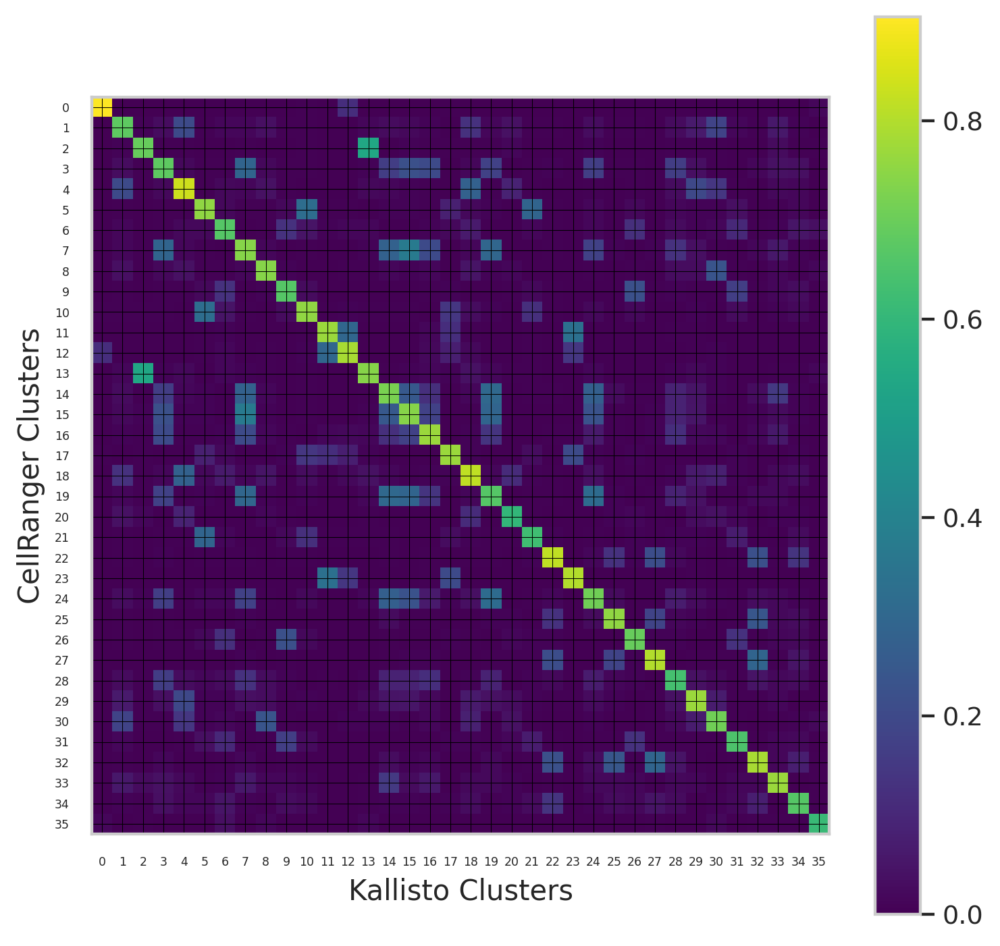

In [ ]:
plt.figure(figsize=(7,7))
plt.imshow(pairCorrs, cmap='viridis')
plt.colorbar()
plt.xlabel('Kallisto Clusters')
plt.ylabel('CellRanger Clusters')

plt.xticks(np.arange(0, 36, 1),fontsize=5)
plt.yticks(np.arange(0, 36, 1),fontsize=5)
plt.grid(color='black',linewidth=0.3)
plt.show()

#### **Cell Type Data for SplitsTree**

In [ ]:
bus_fs_clus

AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
#Compare to pairwise distances between cell atlas clusters
centroids = getClusCentroids(bus_fs_clus,60,'cellRanger_louvain')
#centroids_arr = centroids['centroid'].to_numpy()
pairCentroid_dists = pairwise_distances(centroids, metric = 'l1')
pairCentroid_dists.shape


(36, 36)

In [ ]:

clus = np.unique(bus_fs_clus.obs['cellRanger_louvain'])
df = pd.DataFrame(pairCentroid_dists)
df['cluster'] = range(0,len(clus))

clusters = [int(i) for i in bus_fs_clus.obs['cellRanger_louvain']]
annos = bus_fs_clus.obs['annosSub']

annosDict = {}
for i in range(0,len(clusters)):
  annosDict[clusters[i]] = annos[i]


names = [annosDict[i] for i in df['cluster']]

df['annos'] = names
df.head()

df.to_csv('cellTypeDist_SplitsTree.csv')

In [ ]:
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,cluster,annos
0,0.000000,72.808786,66.327611,72.073472,72.221171,83.721519,72.069704,76.170223,70.880777,85.442991,97.183516,104.484268,49.543106,123.561482,101.361428,100.624817,90.397736,125.285881,106.140454,128.837399,85.624838,133.355707,122.865706,135.071855,130.381493,129.726836,119.031650,180.335733,99.932001,130.105311,112.277999,166.569771,232.595362,124.288189,231.023541,200.961265,0,Stem Cells
1,72.808786,0.000000,74.660422,70.164388,74.361114,89.556233,74.375085,71.364475,76.230698,84.757237,101.573907,113.137091,74.508928,121.889066,96.608405,97.168034,101.620417,134.557738,98.209424,110.046550,93.244312,132.928854,113.151650,131.356370,114.326233,130.695044,119.024909,160.223010,115.072821,143.600945,113.134615,168.345926,211.898876,129.203130,247.881609,247.091791,1,Exumbrella Epidermis
2,66.327611,74.660422,0.000000,65.337471,67.998920,82.508347,76.212882,75.176727,77.050640,84.104681,96.509748,102.126491,69.484831,99.308934,109.110518,92.275635,96.869360,123.762245,106.683458,133.013201,58.014817,137.969722,107.262283,133.557044,124.372263,122.873834,108.327791,181.305637,100.719740,135.554038,110.611939,161.064151,223.012427,102.849803,239.053946,226.983553,2,Large Oocytes
3,72.073472,70.164388,65.337471,0.000000,69.036448,89.045046,82.572017,56.716581,86.499065,91.058211,102.309510,106.470486,72.723282,121.345263,95.870870,81.374499,89.866108,122.379886,105.541089,116.827148,77.232297,139.550421,114.826228,123.779769,105.991631,131.019388,120.134342,176.077028,95.817422,127.819093,112.744109,175.211065,211.234152,116.989947,236.478488,235.921822,3,Digestive Subtype 1
4,72.221171,74.361114,67.998920,69.036448,0.000000,89.771920,78.915772,77.854646,83.597343,92.363973,104.900110,112.615641,76.581277,126.304038,114.492861,97.398086,98.526265,135.874766,102.497095,132.858654,73.100802,143.772648,117.754158,140.242021,124.825309,133.847399,118.384349,176.583669,107.611572,113.966628,93.500675,164.306995,228.605029,120.127074,240.596045,229.703254,4,Manubrium Epidermis
